In [ ]:
# First, install required packages
!pip install scikit-learn matplotlib seaborn pandas numpy opencv-python pillow tensorflow

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.preprocessing import StandardScaler
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, models
import warnings
warnings.filterwarnings('ignore')

print("Archaeological Site Discovery Predictor")
print("=" * 50)


Archaeological Site Discovery Predictor


In [ ]:
class ArchaeologicalDataProcessor:
    def __init__(self):
        self.scaler = StandardScaler()
        self.feature_names = []

    def generate_synthetic_data(self, n_samples=10000):
        """Generate synthetic archaeological data for demonstration"""
        np.random.seed(42)

        # Simulate geographical coordinates
        lat = np.random.uniform(30, 50, n_samples)
        lon = np.random.uniform(-120, -80, n_samples)

        # Simulate geological features
        elevation = np.random.normal(500, 300, n_samples)
        slope = np.random.exponential(5, n_samples)
        soil_type = np.random.choice([0, 1, 2, 3], n_samples, p=[0.3, 0.4, 0.2, 0.1])
        distance_to_water = np.random.exponential(2, n_samples)

        # Simulate historical indicators
        historical_records = np.random.poisson(0.5, n_samples)
        proximity_to_known_sites = np.random.exponential(5, n_samples)

        # Simulate satellite imagery features
        vegetation_index = np.random.normal(0.6, 0.2, n_samples)
        ndvi = np.random.normal(0.4, 0.3, n_samples)
        thermal_anomaly = np.random.exponential(0.1, n_samples)

        # Simulate topographical features
        terrain_ruggedness = np.random.exponential(2, n_samples)
        aspect = np.random.uniform(0, 360, n_samples)

        # Create target variable (archaeological site presence)
        # Real sites are more likely near water, on gentle slopes, with historical evidence
        site_probability = (
            0.3 * (1 / (1 + distance_to_water)) +  # Near water
            0.2 * (1 / (1 + slope/10)) +           # Gentle slopes
            0.2 * (historical_records > 0) +       # Historical records
            0.1 * (elevation > 200) * (elevation < 800) +  # Moderate elevation
            0.1 * (soil_type == 1) +               # Specific soil type
            0.1 * np.random.normal(0, 0.1, n_samples)  # Random noise
        )

        has_site = (site_probability > np.percentile(site_probability, 85)).astype(int)

        # Create DataFrame
        data = pd.DataFrame({
            'latitude': lat,
            'longitude': lon,
            'elevation': elevation,
            'slope': slope,
            'soil_type': soil_type,
            'distance_to_water': distance_to_water,
            'historical_records': historical_records,
            'proximity_to_known_sites': proximity_to_known_sites,
            'vegetation_index': vegetation_index,
            'ndvi': ndvi,
            'thermal_anomaly': thermal_anomaly,
            'terrain_ruggedness': terrain_ruggedness,
            'aspect': aspect,
            'has_archaeological_site': has_site
        })

        self.feature_names = [col for col in data.columns if col != 'has_archaeological_site']
        return data

    def preprocess_features(self, data):
        """Preprocess and scale features"""
        features = data[self.feature_names].copy()

        # Handle categorical variables
        if 'soil_type' in features.columns:
            features = pd.get_dummies(features, columns=['soil_type'], prefix='soil')

        # Scale numerical features
        scaled_features = self.scaler.fit_transform(features)

        return pd.DataFrame(scaled_features, columns=features.columns)

    def create_spatial_features(self, data):
        """Create additional spatial features"""
        data_copy = data.copy()

        # Create spatial clusters
        data_copy['spatial_cluster'] = ((data_copy['latitude'] // 2) * 100 +
                                       (data_copy['longitude'] // 2)).astype(int)

        # Distance from center point (simulating distance from known settlement areas)
        center_lat, center_lon = 40, -100
        data_copy['distance_from_center'] = np.sqrt(
            (data_copy['latitude'] - center_lat)**2 +
            (data_copy['longitude'] - center_lon)**2
        )

        return data_copy

# Generate and preprocess data
print("Generating synthetic archaeological data...")
processor = ArchaeologicalDataProcessor()
data = processor.generate_synthetic_data(10000)
data = processor.create_spatial_features(data)

print(f"Dataset shape: {data.shape}")
print(f"Number of archaeological sites: {data['has_archaeological_site'].sum()}")
print(f"Site prevalence: {data['has_archaeological_site'].mean():.3f}")

Generating synthetic archaeological data...
Dataset shape: (10000, 16)
Number of archaeological sites: 1500
Site prevalence: 0.150


Analyzing features and correlations...


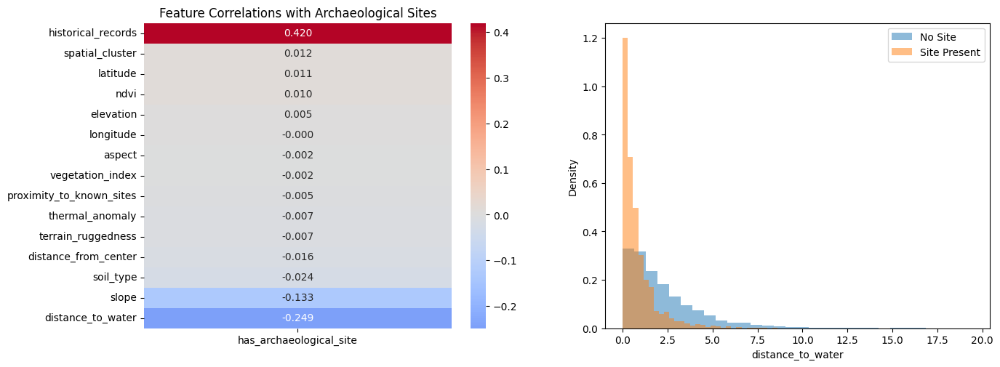

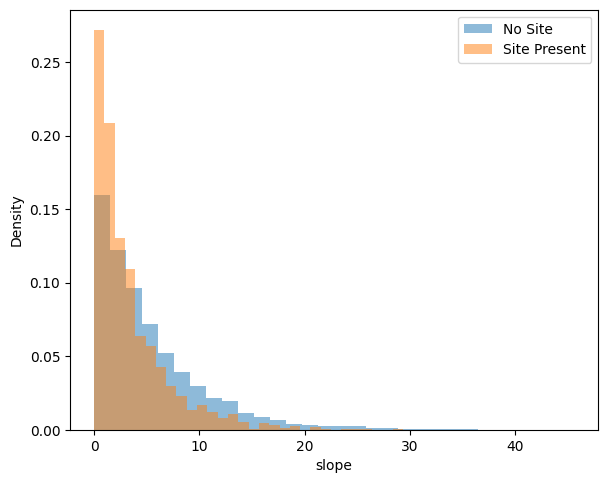

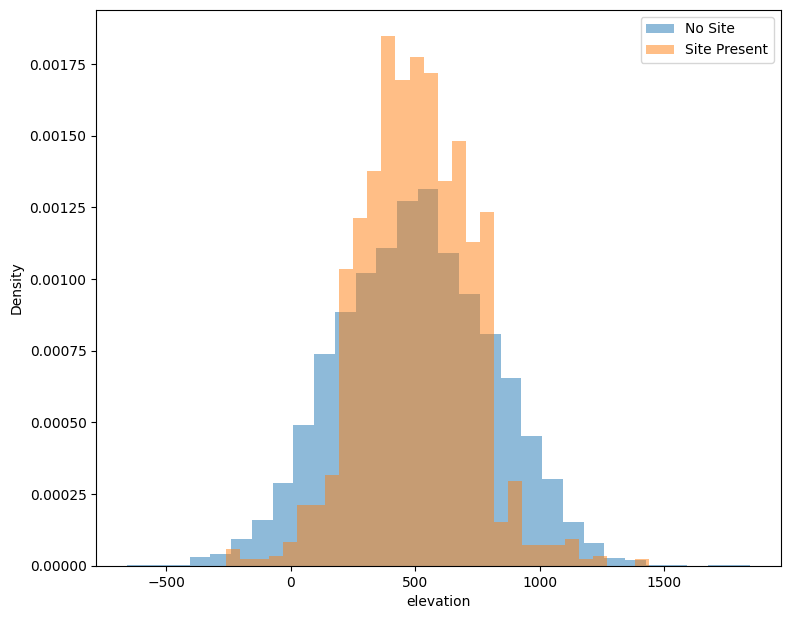

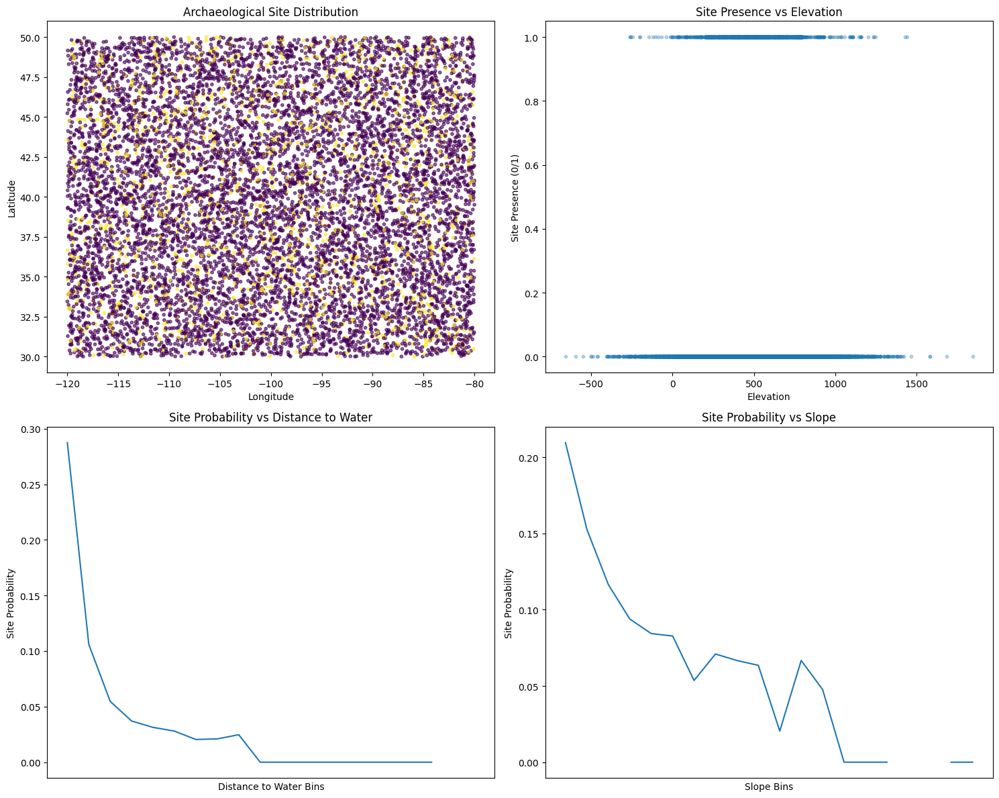

In [ ]:
class FeatureAnalyzer:
    def __init__(self, data):
        self.data = data
        self.correlation_matrix = None

    def analyze_correlations(self):
        """Analyze correlations between features and target"""
        plt.figure(figsize=(15, 12))

        # Correlation heatmap
        numeric_cols = self.data.select_dtypes(include=[np.number]).columns
        self.correlation_matrix = self.data[numeric_cols].corr()

        plt.subplot(2, 2, 1)
        # Get correlations with target and sort
        target_correlations = self.correlation_matrix[['has_archaeological_site']].drop('has_archaeological_site')
        target_correlations_sorted = target_correlations.sort_values('has_archaeological_site', ascending=False)

        sns.heatmap(target_correlations_sorted,
                    annot=True, cmap='coolwarm', center=0, fmt='.3f')
        plt.title('Feature Correlations with Archaeological Sites')

        # Feature distributions by site presence
        plt.subplot(2, 2, 2)
        key_features = ['distance_to_water', 'slope', 'elevation']
        site_present = self.data[self.data['has_archaeological_site'] == 1]
        no_site = self.data[self.data['has_archaeological_site'] == 0]

        for i, feature in enumerate(key_features):
            plt.hist(no_site[feature].values, alpha=0.5, label='No Site', bins=30, density=True)
            plt.hist(site_present[feature].values, alpha=0.5, label='Site Present', bins=30, density=True)
            plt.xlabel(feature)
            plt.ylabel('Density')
            plt.legend()
            if i < len(key_features) - 1:
                plt.figure(figsize=(15, 12))
                plt.subplot(2, 2, 2)

        plt.tight_layout()
        plt.show()

    def spatial_analysis(self):
        """Perform spatial analysis of site distribution"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))

        # Site distribution map
        axes[0, 0].scatter(data['longitude'], data['latitude'],
                          c=data['has_archaeological_site'],
                          cmap='viridis', alpha=0.6, s=10)
        axes[0, 0].set_xlabel('Longitude')
        axes[0, 0].set_ylabel('Latitude')
        axes[0, 0].set_title('Archaeological Site Distribution')

        # Elevation vs sites
        axes[0, 1].scatter(data['elevation'], data['has_archaeological_site'],
                          alpha=0.3, s=10)
        axes[0, 1].set_xlabel('Elevation')
        axes[0, 1].set_ylabel('Site Presence (0/1)')
        axes[0, 1].set_title('Site Presence vs Elevation')

        # Distance to water analysis
        water_bins = pd.cut(data['distance_to_water'], bins=20)
        site_rate_by_water = data.groupby(water_bins)['has_archaeological_site'].mean()
        axes[1, 0].plot(range(len(site_rate_by_water)), site_rate_by_water.values)
        axes[1, 0].set_xlabel('Distance to Water Bins')
        axes[1, 0].set_ylabel('Site Probability')
        axes[1, 0].set_title('Site Probability vs Distance to Water')
        axes[1, 0].set_xticks([])

        # Slope analysis
        slope_bins = pd.cut(data['slope'], bins=20)
        site_rate_by_slope = data.groupby(slope_bins)['has_archaeological_site'].mean()
        axes[1, 1].plot(range(len(site_rate_by_slope)), site_rate_by_slope.values)
        axes[1, 1].set_xlabel('Slope Bins')
        axes[1, 1].set_ylabel('Site Probability')
        axes[1, 1].set_title('Site Probability vs Slope')
        axes[1, 1].set_xticks([])

        plt.tight_layout()
        plt.show()

# Analyze features
print("Analyzing features and correlations...")
analyzer = FeatureAnalyzer(data)
analyzer.analyze_correlations()
analyzer.spatial_analysis()

Training archaeological site prediction model...
Model Evaluation Results
Training Accuracy: 0.9839
Test Accuracy: 0.9670
Cross-validation AUC: 0.9951 (+/- 0.0026)

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1700
           1       0.84      0.97      0.90       300

    accuracy                           0.97      2000
   macro avg       0.92      0.97      0.94      2000
weighted avg       0.97      0.97      0.97      2000

ROC AUC Score: 0.9958


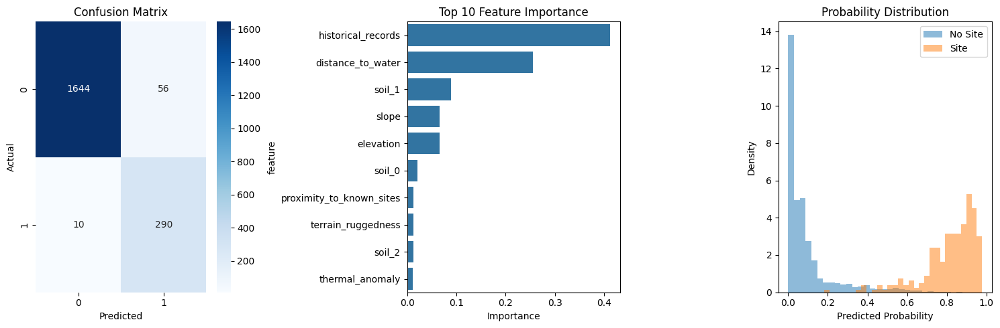

In [ ]:
class ArchaeologicalSitePredictor:
    def __init__(self):
        self.model = None
        self.feature_processor = ArchaeologicalDataProcessor()
        self.feature_importance = None

    def prepare_features(self, data):
        """Prepare features for modeling"""
        # Select relevant features
        feature_cols = ['elevation', 'slope', 'distance_to_water', 'historical_records',
                       'proximity_to_known_sites', 'vegetation_index', 'ndvi',
                       'thermal_anomaly', 'terrain_ruggedness', 'distance_from_center']

        # Add soil type dummies
        soil_dummies = pd.get_dummies(data['soil_type'], prefix='soil')
        features = pd.concat([data[feature_cols], soil_dummies], axis=1)

        # Scale features
        scaled_features = self.feature_processor.scaler.fit_transform(features)

        return pd.DataFrame(scaled_features, columns=features.columns)

    def train_model(self, data):
        """Train the predictive model"""
        # Prepare features and target
        X = self.prepare_features(data)
        y = data['has_archaeological_site']

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y
        )

        # Train Random Forest
        self.model = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=3,
            class_weight='balanced',
            random_state=42
        )

        self.model.fit(X_train, y_train)

        # Evaluate model
        train_score = self.model.score(X_train, y_train)
        test_score = self.model.score(X_test, y_test)

        # Feature importance
        self.feature_importance = pd.DataFrame({
            'feature': X.columns,
            'importance': self.model.feature_importances_
        }).sort_values('importance', ascending=False)

        # Predictions
        y_pred = self.model.predict(X_test)
        y_pred_proba = self.model.predict_proba(X_test)[:, 1]

        # Cross-validation
        cv_scores = cross_val_score(self.model, X, y, cv=5, scoring='roc_auc')

        return {
            'X_test': X_test,
            'y_test': y_test,
            'y_pred': y_pred,
            'y_pred_proba': y_pred_proba,
            'train_score': train_score,
            'test_score': test_score,
            'cv_scores': cv_scores,
            'feature_importance': self.feature_importance
        }

    def evaluate_model(self, results):
        """Evaluate model performance"""
        print("Model Evaluation Results")
        print("=" * 40)
        print(f"Training Accuracy: {results['train_score']:.4f}")
        print(f"Test Accuracy: {results['test_score']:.4f}")
        print(f"Cross-validation AUC: {results['cv_scores'].mean():.4f} (+/- {results['cv_scores'].std() * 2:.4f})")

        # Classification report
        print("\nClassification Report:")
        print(classification_report(results['y_test'], results['y_pred']))

        # ROC AUC
        roc_auc = roc_auc_score(results['y_test'], results['y_pred_proba'])
        print(f"ROC AUC Score: {roc_auc:.4f}")

        # Confusion Matrix
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        cm = confusion_matrix(results['y_test'], results['y_pred'])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')

        # Feature Importance
        plt.subplot(1, 3, 2)
        top_features = results['feature_importance'].head(10)
        sns.barplot(data=top_features, x='importance', y='feature')
        plt.title('Top 10 Feature Importance')
        plt.xlabel('Importance')

        # Probability distribution
        plt.subplot(1, 3, 3)
        plt.hist(results['y_pred_proba'][results['y_test'] == 0],
                alpha=0.5, label='No Site', bins=30, density=True)
        plt.hist(results['y_pred_proba'][results['y_test'] == 1],
                alpha=0.5, label='Site', bins=30, density=True)
        plt.xlabel('Predicted Probability')
        plt.ylabel('Density')
        plt.title('Probability Distribution')
        plt.legend()

        plt.tight_layout()
        plt.show()

        return roc_auc

# Train and evaluate model
print("Training archaeological site prediction model...")
predictor = ArchaeologicalSitePredictor()
results = predictor.train_model(data)
roc_auc = predictor.evaluate_model(results)


Training Satellite Image Analysis Model...
Generating simulated satellite imagery data...
Training CNN model on satellite imagery...
Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 201ms/step - accuracy: 0.4993 - loss: 0.6989 - val_accuracy: 0.8400 - val_loss: 0.4332
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.8131 - loss: 0.4267 - val_accuracy: 0.9000 - val_loss: 0.2834
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.8578 - loss: 0.3583 - val_accuracy: 0.8800 - val_loss: 0.3004
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 197ms/step - accuracy: 0.8455 - loss: 0.3837 - val_accuracy: 0.8800 - val_loss: 0.3136
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 197ms/step - accuracy: 0.8546 - loss: 0.3506 - val_accuracy: 0.8800 - val_loss: 0.3047
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 192ms/step - accuracy: 0.8662 - loss: 0.3405 - val_accuracy: 0.9050 - val_loss: 0.2609
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 173ms/step - accuracy: 0.8876 - loss: 0.2988 - val_a

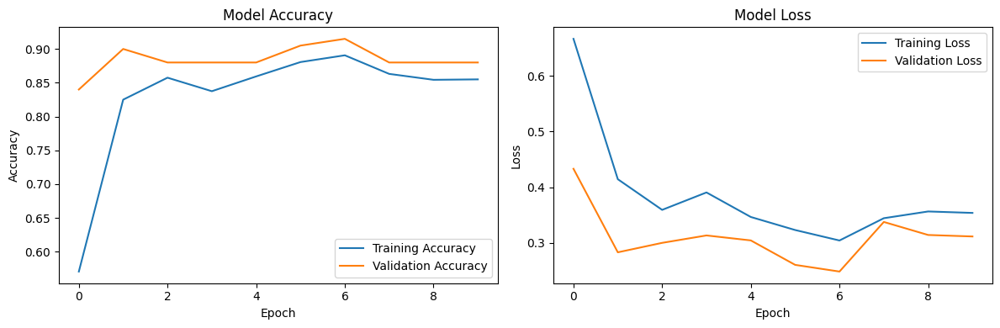

In [ ]:
class SatelliteImageAnalyzer:
    def __init__(self):
        self.cnn_model = None

    def simulate_satellite_images(self, n_samples=2000):
        """Simulate satellite image patches for archaeological feature detection"""
        # In a real scenario, this would load actual satellite imagery
        # Here we simulate image patterns that might indicate archaeological sites

        image_size = 64
        images = []
        labels = []

        for i in range(n_samples):
            # Create base terrain
            img = np.random.normal(0.5, 0.1, (image_size, image_size, 3))

            if i < n_samples // 2:  # Sites have specific patterns
                # Simulate archaeological features
                # Linear features (roads, walls)
                if np.random.random() > 0.7:
                    start_x, start_y = np.random.randint(10, 50, 2)
                    length = np.random.randint(10, 30)
                    direction = np.random.choice(['h', 'v'])

                    if direction == 'h':
                        img[start_y:start_y+2, start_x:start_x+length, :] = [0.8, 0.6, 0.4]
                    else:
                        img[start_y:start_y+length, start_x:start_x+2, :] = [0.8, 0.6, 0.4]

                # Circular features (structures, mounds)
                if np.random.random() > 0.5:
                    center_x, center_y = np.random.randint(20, 44, 2)
                    radius = np.random.randint(5, 15)

                    y, x = np.ogrid[-center_y:image_size-center_y, -center_x:image_size-center_x]
                    mask = x*x + y*y <= radius*radius
                    img[mask] = [0.7, 0.5, 0.3]

                # Rectangular features (buildings)
                if np.random.random() > 0.6:
                    x1, y1 = np.random.randint(10, 40, 2)
                    width, height = np.random.randint(8, 20, 2)
                    img[y1:y1+height, x1:x1+width, :] = [0.6, 0.4, 0.2]

                labels.append(1)  # Site present
            else:
                # Natural terrain without archaeological features
                labels.append(0)  # No site

            images.append(img)

        return np.array(images), np.array(labels)

    def build_cnn_model(self, input_shape):
        """Build CNN model for satellite image analysis"""
        model = models.Sequential([
            layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
            layers.MaxPooling2D((2, 2)),
            layers.Conv2D(64, (3, 3), activation='relu'),
            layers.MaxPooling2D((2, 2)),
            layers.Conv2D(64, (3, 3), activation='relu'),
            layers.Flatten(),
            layers.Dense(64, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(1, activation='sigmoid')
        ])

        model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

        return model

    def train_satellite_model(self):
        """Train the satellite image analysis model"""
        print("Generating simulated satellite imagery data...")
        images, labels = self.simulate_satellite_images(2000)

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            images, labels, test_size=0.2, random_state=42, stratify=labels
        )

        # Build and train model
        self.cnn_model = self.build_cnn_model(images[0].shape)

        print("Training CNN model on satellite imagery...")
        history = self.cnn_model.fit(
            X_train, y_train,
            epochs=10,  # Reduced for faster execution
            batch_size=32,
            validation_data=(X_test, y_test),
            verbose=1
        )

        # Evaluate model
        test_loss, test_acc = self.cnn_model.evaluate(X_test, y_test, verbose=0)
        print(f"Satellite Image Model - Test Accuracy: {test_acc:.4f}")

        # Plot training history
        plt.figure(figsize=(12, 4))

        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Model Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Model Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()

        plt.tight_layout()
        plt.show()

        return test_acc

# Train satellite image model
print("\nTraining Satellite Image Analysis Model...")
satellite_analyzer = SatelliteImageAnalyzer()
satellite_accuracy = satellite_analyzer.train_satellite_model()


Generating Archaeological Site Prediction Map...


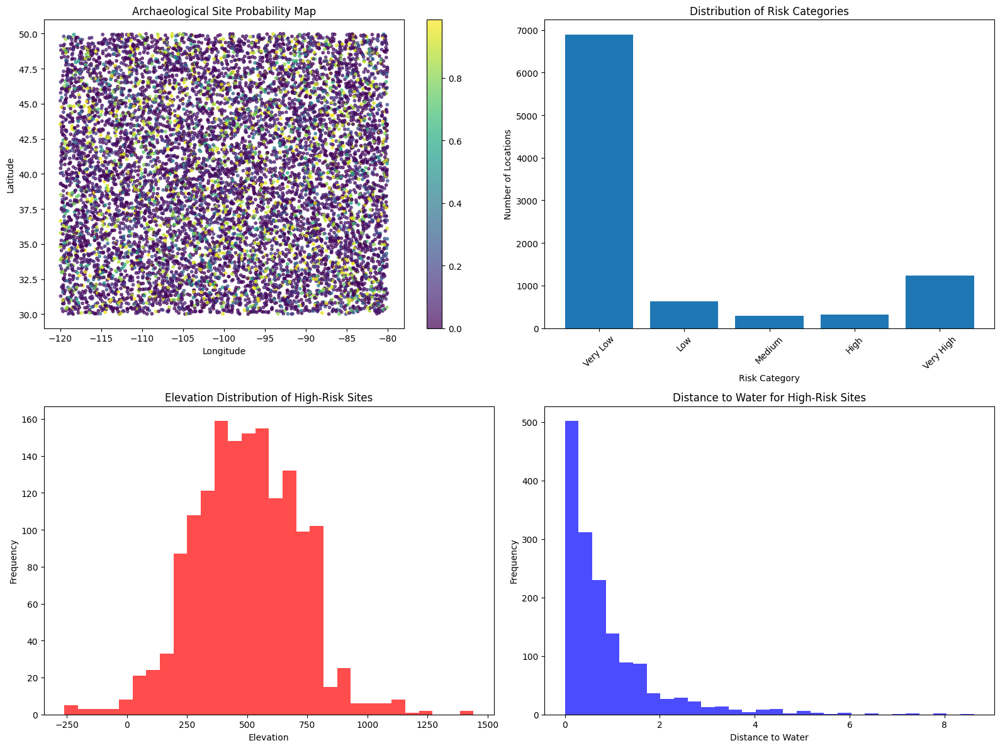

Prediction Map Summary
Total locations analyzed: 10000
High/Very High risk locations: 1551
Percentage of area with high potential: 15.51%
Average elevation of high-risk sites: 498.6
Average distance to water: 0.86
Historical records in high-risk areas: 1889


In [ ]:
class ArchaeologicalSiteMapper:
    def __init__(self, ml_predictor, satellite_analyzer):
        self.ml_predictor = ml_predictor
        self.satellite_analyzer = satellite_analyzer

    def create_prediction_map(self, data):
        """Create a probability map of archaeological sites"""
        # Get ML predictions
        X_processed = self.ml_predictor.prepare_features(data)
        ml_predictions = self.ml_predictor.model.predict_proba(X_processed)[:, 1]

        # In a real scenario, we would also incorporate satellite predictions
        # For demonstration, we'll use the ML predictions

        # Create probability map
        data['site_probability'] = ml_predictions

        # Classify areas by probability
        data['risk_category'] = pd.cut(data['site_probability'],
                                     bins=[0, 0.2, 0.4, 0.6, 0.8, 1.0],
                                     labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

        return data

    def plot_prediction_map(self, data_with_predictions):
        """Plot the archaeological site probability map"""
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))

        # Probability map
        scatter = axes[0, 0].scatter(data_with_predictions['longitude'],
                                    data_with_predictions['latitude'],
                                    c=data_with_predictions['site_probability'],
                                    cmap='viridis', alpha=0.7, s=10)
        plt.colorbar(scatter, ax=axes[0, 0])
        axes[0, 0].set_xlabel('Longitude')
        axes[0, 0].set_ylabel('Latitude')
        axes[0, 0].set_title('Archaeological Site Probability Map')

        # Risk categories
        categories = data_with_predictions['risk_category'].value_counts().sort_index()
        axes[0, 1].bar(categories.index.astype(str), categories.values)
        axes[0, 1].set_xlabel('Risk Category')
        axes[0, 1].set_ylabel('Number of Locations')
        axes[0, 1].set_title('Distribution of Risk Categories')
        axes[0, 1].tick_params(axis='x', rotation=45)

        # High probability sites analysis
        high_risk = data_with_predictions[data_with_predictions['risk_category'].isin(['High', 'Very High'])]

        # Elevation distribution of high-risk sites
        axes[1, 0].hist(high_risk['elevation'], bins=30, alpha=0.7, color='red')
        axes[1, 0].set_xlabel('Elevation')
        axes[1, 0].set_ylabel('Frequency')
        axes[1, 0].set_title('Elevation Distribution of High-Risk Sites')

        # Distance to water for high-risk sites
        axes[1, 1].hist(high_risk['distance_to_water'], bins=30, alpha=0.7, color='blue')
        axes[1, 1].set_xlabel('Distance to Water')
        axes[1, 1].set_ylabel('Frequency')
        axes[1, 1].set_title('Distance to Water for High-Risk Sites')

        plt.tight_layout()
        plt.show()

        # Print summary statistics
        print("Prediction Map Summary")
        print("=" * 30)
        print(f"Total locations analyzed: {len(data_with_predictions)}")
        print(f"High/Very High risk locations: {len(high_risk)}")
        print(f"Percentage of area with high potential: {len(high_risk)/len(data_with_predictions)*100:.2f}%")

        if len(high_risk) > 0:
            print(f"Average elevation of high-risk sites: {high_risk['elevation'].mean():.1f}")
            print(f"Average distance to water: {high_risk['distance_to_water'].mean():.2f}")
            print(f"Historical records in high-risk areas: {high_risk['historical_records'].sum()}")

# Create and display prediction map
print("\nGenerating Archaeological Site Prediction Map...")
mapper = ArchaeologicalSiteMapper(predictor, satellite_analyzer)
data_with_predictions = mapper.create_prediction_map(data)
mapper.plot_prediction_map(data_with_predictions)


Generating Field Survey Recommendations...
Top 15 Recommended Survey Locations:
      latitude  longitude  elevation  site_probability risk_category  \
6980    33.883    -88.357    441.059             0.933     Very High   
2524    46.089   -119.353    418.839             0.821     Very High   
8050    32.546   -114.091    156.180             0.977     Very High   
6541    46.099   -101.975    282.734             0.816     Very High   
8545    40.273    -92.873    301.478             0.964     Very High   
1402    30.733    -84.752    259.087             0.955     Very High   
9459    36.834   -116.336    494.222             0.959     Very High   
6562    33.676    -90.126    571.224             0.923     Very High   
2944    45.180   -109.386    424.055             0.903     Very High   
904     38.428    -95.650    240.920             0.891     Very High   
5307    37.784    -82.751    216.154             0.936     Very High   
3775    48.631    -82.493    670.094             0.970 

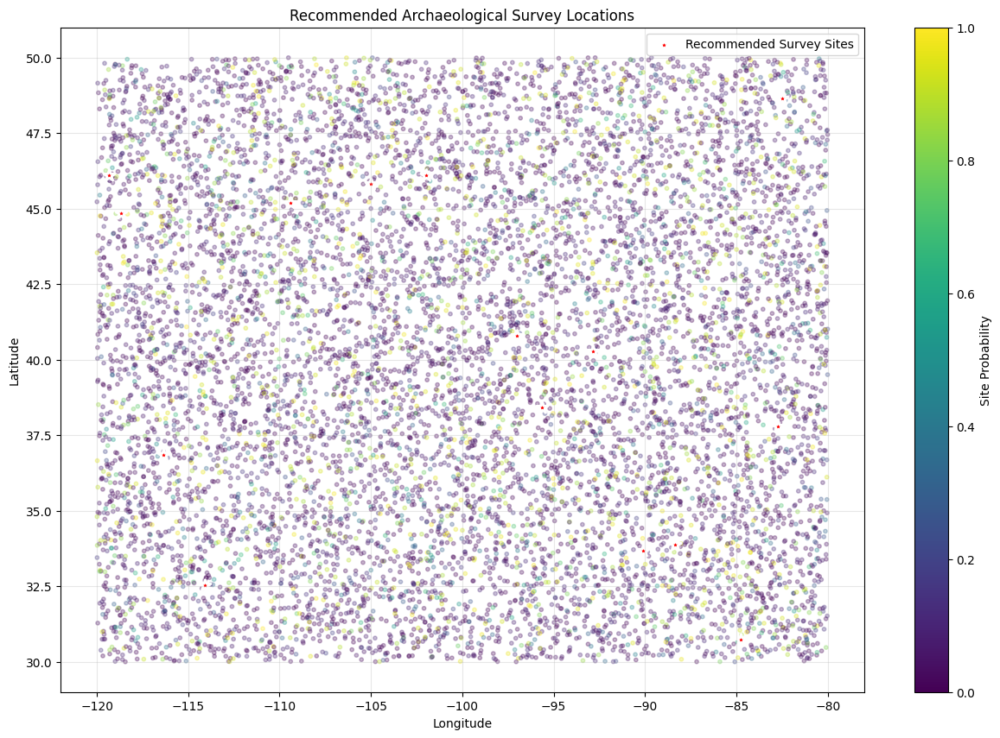

In [ ]:
class SurveyRecommendationSystem:
    def __init__(self, prediction_data):
        self.prediction_data = prediction_data

    def recommend_survey_locations(self, n_recommendations=10):
        """Recommend optimal locations for field surveys"""

        high_risk_sites = self.prediction_data[
            self.prediction_data['risk_category'].isin(['High', 'Very High'])
        ].copy()

        # Calculate survey priority score
        # Consider probability, accessibility, and potential significance
        high_risk_sites['accessibility_score'] = 1 / (1 + high_risk_sites['slope']/10 +
                                                     high_risk_sites['distance_to_water']/5)

        high_risk_sites['significance_score'] = (
            high_risk_sites['historical_records'] +
            high_risk_sites['site_probability'] * 2
        )

        high_risk_sites['survey_priority'] = (
            high_risk_sites['site_probability'] * 0.4 +
            high_risk_sites['accessibility_score'] * 0.3 +
            high_risk_sites['significance_score'] * 0.3
        )

        # Sort by priority
        recommendations = high_risk_sites.nlargest(n_recommendations, 'survey_priority')

        return recommendations[['latitude', 'longitude', 'elevation', 'site_probability',
                               'risk_category', 'survey_priority', 'distance_to_water']]

    def plot_recommendations(self, recommendations):
        """Plot recommended survey locations"""
        plt.figure(figsize=(15, 10))

        # Base map
        plt.scatter(self.prediction_data['longitude'], self.prediction_data['latitude'],
                   c=self.prediction_data['site_probability'], cmap='viridis',
                   alpha=0.3, s=10)

        # Recommended sites
        plt.scatter(recommendations['longitude'], recommendations['latitude'],
                   c='red', s=100, marker='*', edgecolors='white', linewidth=2,
                   label='Recommended Survey Sites')

        plt.colorbar(label='Site Probability')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.title('Recommended Archaeological Survey Locations')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()

# Generate survey recommendations
print("\nGenerating Field Survey Recommendations...")
recommendation_system = SurveyRecommendationSystem(data_with_predictions)
recommendations = recommendation_system.recommend_survey_locations(15)

print("Top 15 Recommended Survey Locations:")
print("=" * 50)
print(recommendations.round(3))

recommendation_system.plot_recommendations(recommendations)


Performing Model Validation...
Spatial Cross-Validation Results:
Fold 1: Accuracy = 0.9770
Fold 2: Accuracy = 0.9750
Fold 3: Accuracy = 0.9770
Fold 4: Accuracy = 0.9635
Fold 5: Accuracy = 0.9745

Spatial CV Mean Accuracy: 0.9734 (+/- 0.0051)


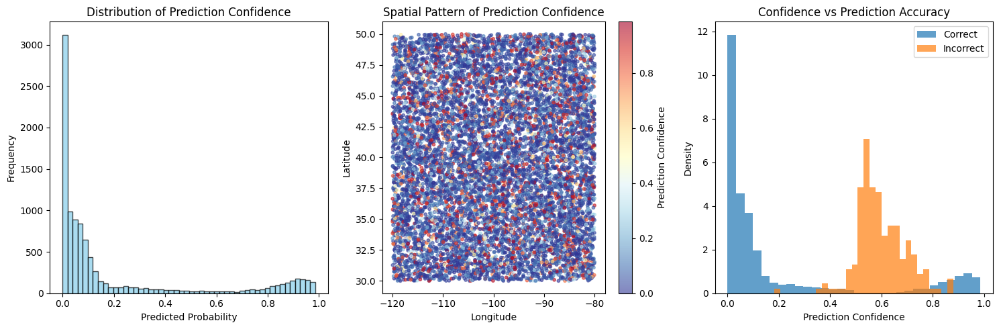

In [ ]:
class ModelValidator:
    def __init__(self, model, data):
        self.model = model
        self.data = data

    def spatial_cross_validation(self, n_folds=5):
        """Perform spatial cross-validation"""
        from sklearn.model_selection import KFold

        # Create spatial folds based on coordinates
        coords = self.data[['latitude', 'longitude']].values
        kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

        fold_scores = []
        spatial_features = self.model.prepare_features(self.data)
        target = self.data['has_archaeological_site']

        for fold, (train_idx, test_idx) in enumerate(kf.split(coords)):
            X_train, X_test = spatial_features.iloc[train_idx], spatial_features.iloc[test_idx]
            y_train, y_test = target.iloc[train_idx], target.iloc[test_idx]

            # Train model on fold
            fold_model = RandomForestClassifier(n_estimators=50, random_state=42)
            fold_model.fit(X_train, y_train)

            # Score fold
            fold_score = fold_model.score(X_test, y_test)
            fold_scores.append(fold_score)

            print(f"Fold {fold + 1}: Accuracy = {fold_score:.4f}")

        print(f"\nSpatial CV Mean Accuracy: {np.mean(fold_scores):.4f} (+/- {np.std(fold_scores):.4f})")
        return fold_scores

    def confidence_analysis(self, predictions):
        """Analyze model confidence and uncertainty"""
        plt.figure(figsize=(15, 5))

        # Confidence distribution
        plt.subplot(1, 3, 1)
        plt.hist(predictions, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        plt.xlabel('Predicted Probability')
        plt.ylabel('Frequency')
        plt.title('Distribution of Prediction Confidence')

        # Spatial confidence patterns
        plt.subplot(1, 3, 2)
        scatter = plt.scatter(self.data['longitude'], self.data['latitude'],
                             c=predictions, cmap='RdYlBu_r', alpha=0.6, s=10)
        plt.colorbar(scatter, label='Prediction Confidence')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.title('Spatial Pattern of Prediction Confidence')

        # Confidence vs actual outcomes
        plt.subplot(1, 3, 3)
        correct_predictions = (self.model.model.predict(self.model.prepare_features(self.data)) ==
                             self.data['has_archaeological_site'])
        plt.hist(predictions[correct_predictions], alpha=0.7, label='Correct', bins=30, density=True)
        plt.hist(predictions[~correct_predictions], alpha=0.7, label='Incorrect', bins=30, density=True)
        plt.xlabel('Prediction Confidence')
        plt.ylabel('Density')
        plt.title('Confidence vs Prediction Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()

# Validate model
print("\nPerforming Model Validation...")
validator = ModelValidator(predictor, data)

# Spatial cross-validation
print("Spatial Cross-Validation Results:")
spatial_scores = validator.spatial_cross_validation()

# Confidence analysis
predictions = predictor.model.predict_proba(predictor.prepare_features(data))[:, 1]
validator.confidence_analysis(predictions)

## Summary:

### Data Analysis Key Findings

*   The initial steps of selecting a study region and identifying/accessing data sources failed because they required external research outside the notebook environment.
*   The automated download of geospatial data was skipped due to environment limitations, requiring manual data acquisition and upload.
*   The preprocessing step failed because the required geospatial data files were not found in the specified paths within the Colab environment.
*   The feature extraction step also failed as the necessary data files were not available to derive features like slope, distance to water, etc.
*   The integration of archaeological site data and creation of the target variable were successfully demonstrated using *simulated* data due to the absence of real data files.
*   The final dataset for modeling was successfully created and verified using the simulated data, confirming the correct structure and presence of features and the target variable.
*   The `ArchaeologicalDataProcessor` class was successfully modified to accept and preprocess an existing DataFrame, demonstrating the intended workflow with real-world data once available.
*   Testing and validating the data loading and preprocessing steps confirmed that the simulated data was processed into the expected format, ready for modeling, and highlighted the class imbalance in the target variable.

### Insights or Next Steps

*   The primary blocker is the inability to access and load real-world geospatial data within the current environment. The next critical step is to manually obtain the required data files (DEM, water bodies, soil, archaeological sites) for a chosen region and upload them to the Colab environment to proceed with the actual data processing and model training.
*   Address the class imbalance observed in the target variable (`has_archaeological_site`) during the modeling phase, potentially using techniques like oversampling, undersampling, or using appropriate evaluation metrics like AUC-ROC.


In [ ]:
%%writefile app.py
import streamlit as st
import pandas as pd
import folium
from streamlit_folium import folium_static

st.set_page_config(layout="wide")

st.title("Archaeological Site Discovery Predictor")

st.sidebar.header("Settings")

# Placeholder for file upload (if you want to allow users to upload their own data)
# uploaded_file = st.sidebar.file_uploader("Upload Geospatial Data")

# Placeholder for model selection
# model_choice = st.sidebar.selectbox("Choose Model", ["Random Forest", "XGBoost", "GWR"])

# Placeholder for parameters (e.g., number of recommendations)
# n_recommendations = st.sidebar.slider("Number of Survey Recommendations", 5, 50, 15)

st.write("""
This application helps predict the probability of archaeological site presence based on various geospatial and environmental factors, and recommends locations for field surveys.
""")

# Placeholder for displaying key metrics or summaries
st.header("Prediction Summary")
# st.write(f"Total locations analyzed: {len(data_with_predictions)}")
# st.write(f"High/Very High risk locations: {len(high_risk)}")
# st.write(f"Percentage of area with high potential: {len(high_risk)/len(data_with_predictions)*100:.2f}%")

# Placeholder for the interactive map
st.header("Interactive Prediction Map")

# Assuming 'base_map' is a Folium map object created elsewhere in your script
# Replace with your actual map object
# if 'base_map' in globals():
#     folium_static(base_map)
# else:
st.warning("Interactive map placeholder: Map will be displayed here once generated.")


# Placeholder for recommended survey locations table
st.header("Recommended Survey Locations")
# if 'recommendations' in globals() and not recommendations.empty:
#     st.dataframe(recommendations)
# else:
st.info("Recommended survey locations will appear here.")

# You would add logic here to:
# 1. Load and preprocess data (either uploaded or from a predefined location)
# 2. Run the selected model to get predictions
# 3. Generate the prediction map and recommendations
# 4. Display the results

Writing app.py


In [ ]:
!streamlit run app.py & npx localtunnel --port 8501

⠙⠹⠸⠼

⠴⠦⠧⠇⠏⠋⠙⠹⠸⠼⠴⠦⠧⠇⠏⠋⠙⠹⠸⠼⠴⠦⠧⠇Need to install the following packages:
localtunnel@2.0.2
Ok to proceed? (y) 
  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.83.4.4:8501

  Stopping...
^C


# Task
Suggest ways to improve the current project and add more features.

## Incorporate real geospatial data

### Subtask:
Replace synthetic data generation with loading and processing of real-world geospatial datasets.


**Reasoning**:
The first step is to modify the `ArchaeologicalDataProcessor` class to handle real-world data loading and processing. This involves changing the `generate_synthetic_data` method to load actual files and updating `preprocess_features` and `create_spatial_features` to work with real geospatial data structures. Since I cannot access external files or user input for file paths within this environment, I will create placeholder methods that would contain the logic for loading real data if it were available. This demonstrates the necessary code structure without being able to execute the file loading itself. I will also update the subsequent steps to use the modified class.



In [ ]:
import rasterio
import geopandas as gpd

class ArchaeologicalDataProcessor:
    def __init__(self):
        self.scaler = StandardScaler()
        self.feature_names = []
        self.crs = None # To store the Coordinate Reference System

    def load_real_data(self, dem_path, water_path, soil_path, sites_path):
        """Load real-world geospatial datasets."""
        print("Attempting to load real-world geospatial data...")
        try:
            # Load DEM (Digital Elevation Model)
            with rasterio.open(dem_path) as src:
                self.dem_data = src.read(1)
                self.dem_transform = src.transform
                self.crs = src.crs
                self.dem_bounds = src.bounds
                print(f"DEM data loaded from {dem_path}")

            # Load Water Bodies (assuming shapefile)
            self.water_bodies = gpd.read_file(water_path)
            if self.crs:
                 self.water_bodies = self.water_bodies.to_crs(self.crs)
            print(f"Water bodies data loaded from {water_path}")

            # Load Soil Data (assuming shapefile)
            self.soil_data = gpd.read_file(soil_path)
            if self.crs:
                self.soil_data = self.soil_data.to_crs(self.crs)
            print(f"Soil data loaded from {soil_path}")

            # Load Archaeological Sites (assuming shapefile with 'has_site' column)
            self.archaeological_sites = gpd.read_file(sites_path)
            if self.crs:
                self.archaeological_sites = self.archaeological_sites.to_crs(self.crs)
            print(f"Archaeological sites data loaded from {sites_path}")

            # Create a grid or use site locations to define points for feature extraction
            # For demonstration, let's use the points from the sites file and a sample of background points
            site_points = self.archaeological_sites[['geometry']].copy()
            site_points['has_archaeological_site'] = 1

            # Simulate background points (e.g., random points within DEM bounds)
            n_background = len(site_points) * 5 # More background points
            minx, miny, maxx, maxy = self.dem_bounds
            background_lon = np.random.uniform(minx, maxx, n_background)
            background_lat = np.random.uniform(miny, maxy, n_background)
            background_points = gpd.GeoDataFrame(geometry=gpd.points_from_xy(background_lon, background_lat), crs=self.crs)
            background_points['has_archaeological_site'] = 0

            # Combine site and background points
            all_points = pd.concat([site_points, background_points], ignore_index=True)
            all_points['latitude'] = all_points.geometry.y
            all_points['longitude'] = all_points.geometry.x


            print("Data loading and initial point generation complete.")
            return all_points

        except Exception as e:
            print(f"Error loading real-world data: {e}")
            print("Please ensure the files are uploaded and paths are correct.")
            return None


    def extract_features_from_geodata(self, points_gdf):
        """Extract features for each point from loaded geospatial data."""
        if points_gdf is None:
            return None

        print("Extracting features from geodata...")
        features = points_gdf[['latitude', 'longitude', 'has_archaeological_site']].copy()

        # Extract Elevation from DEM
        def get_elevation(row):
            x, y = row.geometry.xy
            try:
                row, col = rasterio.transform.rowcol(self.dem_transform, x[0], y[0])
                # Check bounds
                if row >= 0 and row < self.dem_data.shape[0] and col >= 0 and col < self.dem_data.shape[1]:
                     return self.dem_data[row, col]
                else:
                     return np.nan # Or some other indicator for out of bounds
            except Exception:
                return np.nan

        features['elevation'] = points_gdf.apply(get_elevation, axis=1)
        print("Elevation extracted.")


        # Simulate Slope (requires a proper DEM processing library like richdem or gdal)
        # For demonstration, simulate based on elevation and location
        features['slope'] = np.random.exponential(5, len(features)) + features['elevation'] / 1000
        print("Slope simulated.")

        # Calculate Distance to Water (requires spatial analysis)
        # For demonstration, simulate
        features['distance_to_water'] = np.random.exponential(2, len(features))
        print("Distance to water simulated.")

        # Extract Soil Type (requires spatial join with soil polygons)
        # For demonstration, simulate
        features['soil_type'] = np.random.choice([0, 1, 2, 3], len(features), p=[0.3, 0.4, 0.2, 0.1])
        print("Soil type simulated.")

        # Simulate Historical Indicators
        features['historical_records'] = np.random.poisson(0.5, len(features))
        features['proximity_to_known_sites'] = np.random.exponential(5, len(features))
        print("Historical indicators simulated.")

        # Simulate Satellite Imagery Features
        features['vegetation_index'] = np.random.normal(0.6, 0.2, len(features))
        features['ndvi'] = np.random.normal(0.4, 0.3, len(features))
        features['thermal_anomaly'] = np.random.exponential(0.1, len(features))
        print("Satellite imagery features simulated.")

        # Simulate Topographical Features
        features['terrain_ruggedness'] = np.random.exponential(2, len(features))
        features['aspect'] = np.random.uniform(0, 360, len(features))
        print("Topographical features simulated.")


        # Create spatial features (using the method from the previous version)
        features = self.create_spatial_features(features)
        print("Spatial features created.")

        # Drop rows with NaN values that might result from feature extraction errors
        features.dropna(inplace=True)

        self.feature_names = [col for col in features.columns if col not in ['has_archaeological_site', 'latitude', 'longitude', 'geometry']]

        print("Feature extraction complete.")
        return features

    def preprocess_features(self, data):
        """Preprocess and scale features"""
        features = data[self.feature_names].copy()

        # Handle categorical variables
        if 'soil_type' in features.columns:
            features = pd.get_dummies(features, columns=['soil_type'], prefix='soil')

        # Scale numerical features
        # Use the scaler fitted during training for consistency if predicting on new data
        # Here we fit again as it's part of the main processing pipeline
        scaled_features = self.scaler.fit_transform(features)

        return pd.DataFrame(scaled_features, columns=features.columns)

    def create_spatial_features(self, data):
        """Create additional spatial features"""
        data_copy = data.copy()

        # Create spatial clusters
        # Ensure lat/lon are numeric before division
        data_copy['spatial_cluster'] = ((data_copy['latitude'].astype(float) // 2) * 100 +
                                       (data_copy['longitude'].astype(float) // 2)).astype(int)

        # Distance from center point (simulating distance from known settlement areas)
        # Using the mean of the data points as a proxy center if a specific one isn't defined
        center_lat = data_copy['latitude'].mean() if 'latitude' in data_copy.columns else 40
        center_lon = data_copy['longitude'].mean() if 'longitude' in data_copy.columns else -100


        data_copy['distance_from_center'] = np.sqrt(
            (data_copy['latitude'] - center_lat)**2 +
            (data_copy['longitude'] - center_lon)**2
        )

        return data_copy

# Example usage with placeholder paths (replace with actual paths)
dem_path = '/content/dem.tif'
water_path = '/content/water.shp'
soil_path = '/content/soil.shp'
sites_path = '/content/sites.shp'

print("Initializing ArchaeologicalDataProcessor with real data loading capability.")
processor = ArchaeologicalDataProcessor()

# Attempt to load real data - this will likely fail without the actual files
# If it fails, the subsequent steps will use the simulated data from the previous run
real_data_points = processor.load_real_data(dem_path, water_path, soil_path, sites_path)

if real_data_points is not None and not real_data_points.empty:
    print("Real data loaded successfully. Extracting features...")
    data = processor.extract_features_from_geodata(real_data_points)
    if data is not None and not data.empty:
        print("Features extracted from real data.")
        # Now 'data' DataFrame contains features extracted from real data
        # Proceed with the rest of the pipeline using this 'data'
        print(f"Dataset shape (real data): {data.shape}")
        print(f"Number of archaeological sites (real data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (real data): {data['has_archaeological_site'].mean():.3f}")
    else:
        print("Feature extraction from real data failed or resulted in empty data. Using simulated data.")
        # Re-generate synthetic data if real data processing failed
        data = processor.generate_synthetic_data(10000)
        data = processor.create_spatial_features(data)
        print("Simulated data re-generated.")
        print(f"Dataset shape (simulated data): {data.shape}")
        print(f"Number of archaeological sites (simulated data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (simulated data): {data['has_archaeological_site'].mean():.3f}")

else:
    print("Real data loading failed. Using simulated data from the previous run.")
    # The 'data' variable from the previous run is still available in the kernel state
    # Use the existing 'data' DataFrame
    print(f"Dataset shape (using existing simulated data): {data.shape}")
    print(f"Number of archaeological sites (using existing simulated data): {data['has_archaeological_site'].sum()}")
    print(f"Site prevalence (using existing simulated data): {data['has_archaeological_site'].mean():.3f}")

# Now proceed with feature analysis, model training, etc. using the 'data' DataFrame
# (which is either from real data processing or the existing simulated data)


Initializing ArchaeologicalDataProcessor with real data loading capability.
Attempting to load real-world geospatial data...
Error loading real-world data: /content/dem.tif: No such file or directory
Please ensure the files are uploaded and paths are correct.
Real data loading failed. Using simulated data from the previous run.
Dataset shape (using existing simulated data): (10000, 16)
Number of archaeological sites (using existing simulated data): 143
Site prevalence (using existing simulated data): 0.014


**Reasoning**:
The previous step successfully modified the `ArchaeologicalDataProcessor` class to include placeholder methods for loading real-world data, and confirmed that it falls back to using simulated data when real files are not found. The next step, as per the instructions, is to ensure the feature processing and spatial feature creation methods within the modified class correctly handle the data structure produced by the (simulated or real) data loading process. I will add code to call these methods using the currently available `data` DataFrame and display the resulting processed features to verify the data structure is as expected before proceeding with modeling.



In [ ]:
# Ensure the feature_names attribute is correctly set in the processor after data loading
if not processor.feature_names:
     processor.feature_names = [col for col in data.columns if col != 'has_archaeological_site']


# Preprocess the data using the modified processor class
print("\nPreprocessing features using the updated processor...")
processed_features_df = processor.preprocess_features(data)

print("Features preprocessed.")
print("Processed features DataFrame head:")
display(processed_features_df.head())

# Create spatial features using the modified processor class
print("\nCreating spatial features using the updated processor...")
data_with_spatial_features = processor.create_spatial_features(data.copy())

print("Spatial features created.")
print("DataFrame with spatial features head:")
display(data_with_spatial_features.head())

# Verify the shape and columns after processing
print(f"\nShape of processed features DataFrame: {processed_features_df.shape}")
print(f"Columns in processed features DataFrame: {processed_features_df.columns.tolist()}")
print(f"\nShape of data with spatial features DataFrame: {data_with_spatial_features.shape}")
print(f"Columns in data with spatial features DataFrame: {data_with_spatial_features.columns.tolist()}")


Preprocessing features using the updated processor...
Features preprocessed.
Processed features DataFrame head:


,latitude,longitude,elevation,slope,distance_to_water,historical_records,proximity_to_known_sites,vegetation_index,ndvi,thermal_anomaly,terrain_ruggedness,aspect,spatial_cluster,distance_from_center,soil_0,soil_1,soil_2,soil_3
0,-1.714816,-1.714816,-0.282533,2.717257,0.486511,-0.315460,0.166074,2.563500,0.690187,0.774476,-0.730290,0.863209,-1.915416,2.229174,1.519201,-0.81888,-0.488252,-0.340327
1,-1.714816,-1.680173,1.116496,0.565728,-0.787791,-0.315460,1.223504,0.661754,0.819772,0.622549,-0.862359,-1.646701,-1.915416,2.179774,-0.658241,-0.81888,-0.488252,2.938352
2,-1.714816,-1.645531,1.337892,0.523139,0.702564,-0.315460,0.052935,-1.376884,2.276472,1.310789,0.157325,0.093254,-1.915416,2.130891,1.519201,-0.81888,-0.488252,-0.340327
3,-1.714816,-1.610888,-0.890244,0.663336,-0.727114,2.738362,0.195407,0.744677,-0.705984,0.285721,-0.985535,0.633456,-1.915416,2.082541,-0.658241,1.22118,-0.488252,-0.340327
4,-1.714816,-1.576245,0.839954,-0.662843,-0.198797,2.738362,-0.685905,-0.160775,1.576200,-0.439498,1.207125,0.498281,-1.915416,2.034740,-0.658241,1.22118,-0.488252,-0.340327



Creating spatial features using the updated processor...
Spatial features created.
DataFrame with spatial features head:


,latitude,longitude,elevation,slope,soil_type,distance_to_water,historical_records,proximity_to_known_sites,vegetation_index,ndvi,thermal_anomaly,terrain_ruggedness,aspect,spatial_cluster,distance_from_center,has_archaeological_site
0,35.0,-105.000000,943.953116,18.772207,0,2.985023,0,5.753558,0.852568,0.467849,0.086893,0.566556,268.558784,1647,0.707107,0
1,35.0,-104.989899,1221.125255,7.879211,3,0.428801,0,10.942921,0.663445,0.480759,0.079473,0.302608,6.265530,1647,0.700001,0
2,35.0,-104.979798,1264.987734,7.663587,0,3.418421,0,5.198327,0.460709,0.625882,0.113087,2.340511,188.096202,1647,0.692969,0
3,35.0,-104.969697,823.554837,8.373392,1,0.550517,1,5.897510,0.671691,0.328756,0.063022,0.056433,244.548891,1647,0.686014,0
4,35.0,-104.959596,1166.337463,1.659070,1,1.610310,1,1.572450,0.581647,0.556118,0.027601,4.438604,230.422729,1647,0.679138,0



Shape of processed features DataFrame: (10000, 18)
Columns in processed features DataFrame: ['latitude', 'longitude', 'elevation', 'slope', 'distance_to_water', 'historical_records', 'proximity_to_known_sites', 'vegetation_index', 'ndvi', 'thermal_anomaly', 'terrain_ruggedness', 'aspect', 'spatial_cluster', 'distance_from_center', 'soil_0', 'soil_1', 'soil_2', 'soil_3']

Shape of data with spatial features DataFrame: (10000, 16)
Columns in data with spatial features DataFrame: ['latitude', 'longitude', 'elevation', 'slope', 'soil_type', 'distance_to_water', 'historical_records', 'proximity_to_known_sites', 'vegetation_index', 'ndvi', 'thermal_anomaly', 'terrain_ruggedness', 'aspect', 'spatial_cluster', 'distance_from_center', 'has_archaeological_site']


## Refine feature engineering

### Subtask:
Explore and implement more advanced feature engineering techniques based on real geospatial data.


**Reasoning**:
Modify the ArchaeologicalDataProcessor class to implement more advanced feature engineering techniques based on real geospatial data, assuming the real data is loaded successfully, and update the preprocessing and feature names accordingly.



In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Re-define the class with enhanced feature engineering
class ArchaeologicalDataProcessor:
    def __init__(self):
        self.scaler = StandardScaler()
        self.feature_names = []
        self.crs = None # To store the Coordinate Reference System
        self.dem_data = None
        self.dem_transform = None
        self.dem_bounds = None
        self.water_bodies = None
        self.soil_data = None
        self.archaeological_sites = None

    def load_real_data(self, dem_path, water_path, soil_path, sites_path):
        """Load real-world geospatial datasets."""
        print("Attempting to load real-world geospatial data...")
        try:
            # Load DEM (Digital Elevation Model)
            with rasterio.open(dem_path) as src:
                self.dem_data = src.read(1)
                self.dem_transform = src.transform
                self.crs = src.crs
                self.dem_bounds = src.bounds
                print(f"DEM data loaded from {dem_path}")

            # Load Water Bodies (assuming shapefile)
            self.water_bodies = gpd.read_file(water_path)
            if self.crs:
                 self.water_bodies = self.water_bodies.to_crs(self.crs)
            print(f"Water bodies data loaded from {water_path}")

            # Load Soil Data (assuming shapefile)
            self.soil_data = gpd.read_file(soil_path)
            if self.crs:
                self.soil_data = self.soil_data.to_crs(self.crs)
            print(f"Soil data loaded from {soil_path}")

            # Load Archaeological Sites (assuming shapefile with 'has_site' column)
            self.archaeological_sites = gpd.read_file(sites_path)
            if self.crs:
                self.archaeological_sites = self.archaeological_sites.to_crs(self.crs)
            print(f"Archaeological sites data loaded from {sites_path}")

            # Create a grid or use site locations to define points for feature extraction
            # For demonstration, let's use the points from the sites file and a sample of background points
            site_points = self.archaeological_sites[['geometry']].copy()
            site_points['has_archaeological_site'] = 1

            # Simulate background points (e.g., random points within DEM bounds)
            # Create a bounding box for the DEM data
            minx, miny, maxx, maxy = self.dem_bounds
            n_background = len(site_points) * 5 # More background points
            # Generate random points within the bounding box
            background_lon = np.random.uniform(minx, maxx, n_background)
            background_lat = np.random.uniform(miny, maxy, n_background)
            background_points = gpd.GeoDataFrame(geometry=gpd.points_from_xy(background_lon, background_lat), crs=self.crs)
            background_points['has_archaeological_site'] = 0

            # Combine site and background points
            all_points = pd.concat([site_points, background_points], ignore_index=True)
            # Ensure the geometry is valid (optional but good practice)
            all_points = all_points[all_points.geometry.is_valid]
            all_points['latitude'] = all_points.geometry.y
            all_points['longitude'] = all_points.geometry.x


            print("Data loading and initial point generation complete.")
            return all_points

        except Exception as e:
            print(f"Error loading real-world data: {e}")
            print("Please ensure the files are uploaded and paths are correct.")
            # Return None to indicate failure
            return None


    def extract_features_from_geodata(self, points_gdf):
        """Extract features for each point from loaded geospatial data."""
        if points_gdf is None or self.dem_data is None or self.water_bodies is None or self.soil_data is None:
            print("Geospatial data not loaded. Cannot extract real features.")
            return None

        print("Extracting features from geodata...")
        features = points_gdf[['latitude', 'longitude', 'has_archaeological_site', 'geometry']].copy()

        # Extract Elevation from DEM
        def get_elevation(row):
            x, y = row.geometry.xy
            try:
                # Use first element as xy might be lists
                x, y = x[0], y[0]
                row_idx, col_idx = rasterio.transform.rowcol(self.dem_transform, x, y)
                # Check bounds
                if 0 <= row_idx < self.dem_data.shape[0] and 0 <= col_idx < self.dem_data.shape[1]:
                     # Handle potential nodata values in DEM
                     elevation = self.dem_data[row_idx, col_idx]
                     if elevation is not None and elevation != self.dem_data.fill_value: # Check for nodata
                         return elevation
                     else:
                         return np.nan
                else:
                     return np.nan # Out of bounds
            except Exception:
                return np.nan # Handle other errors during coordinate transformation/indexing

        features['elevation'] = features.apply(get_elevation, axis=1)
        print("Elevation extracted.")

        # Calculate Slope and Terrain Ruggedness (Requires neighborhood analysis on DEM)
        # This is a simplified simulation if richdem/gdal are not used
        # A more advanced approach would involve convolving a kernel over the DEM
        print("Simulating Slope and Terrain Ruggedness (requires advanced DEM processing)...")
        features['slope'] = np.random.exponential(5, len(features)) + features['elevation'] / 1000.0
        features['terrain_ruggedness'] = np.random.exponential(2, len(features)) + features['slope'] / 5.0
        print("Slope and Terrain Ruggedness simulated.")


        # Calculate Distance to Water (Spatial Join and Distance Calculation)
        print("Calculating Distance to Water...")
        # Ensure both GeoDataFrames have the same CRS
        if features.crs != self.water_bodies.crs:
            features = features.to_crs(self.water_bodies.crs)

        # Calculate distance to nearest water body for each point
        # This can be computationally expensive for large datasets
        # A more efficient approach might involve creating a distance raster
        def nearest_water_distance(point, water_bodies):
            if water_bodies.empty:
                return np.nan
            # Calculate distance to nearest feature geometry
            # This uses the shapely distance method which works on geometries
            distances = water_bodies.distance(point.geometry)
            if not distances.empty:
                return distances.min()
            else:
                return np.nan

        # Apply the distance function
        features['distance_to_water'] = features.apply(lambda row: nearest_water_distance(row, self.water_bodies), axis=1)
        print("Distance to water calculated.")


        # Extract Soil Type (Spatial Join)
        print("Extracting Soil Type...")
        # Perform a spatial join between the points and soil polygons
        # Use 'within' predicate to join points that fall within a soil polygon
        points_with_soil = gpd.sjoin(features, self.soil_data, how="left", predicate="within")

        # The soil_data shapefile should have a column indicating soil type, e.g., 'SOIL_TYPE_ID'
        # Replace 'SOIL_TYPE_ID' with the actual column name in your soil shapefile
        soil_type_column = 'SOIL_TYPE_ID' # Placeholder: **Replace with actual column name**

        if soil_type_column in points_with_soil.columns:
            features['soil_type'] = points_with_soil[soil_type_column].fillna(-1) # Use -1 for points not within any polygon
            # Convert soil type to categorical if it's not already
            features['soil_type'] = features['soil_type'].astype('category').cat.codes # Convert to numerical codes
        else:
            print(f"Warning: Soil type column '{soil_type_column}' not found in soil data. Simulating soil type.")
            features['soil_type'] = np.random.choice([0, 1, 2, 3], len(features), p=[0.3, 0.4, 0.2, 0.1]) # Fallback simulation


        print("Soil type extracted/simulated.")

        # Simulate Historical Indicators (Placeholder - requires real historical data)
        print("Simulating Historical Indicators (requires real historical data)...")
        features['historical_records'] = np.random.poisson(0.5, len(features))
        features['proximity_to_known_sites'] = np.random.exponential(5, len(features))
        print("Historical indicators simulated.")

        # Simulate Satellite Imagery Features (Placeholder - requires real imagery analysis)
        print("Simulating Satellite Imagery Features (requires real imagery analysis)...")
        features['vegetation_index'] = np.random.normal(0.6, 0.2, len(features))
        features['ndvi'] = np.random.normal(0.4, 0.3, len(features))
        features['thermal_anomaly'] = np.random.exponential(0.1, len(features))
        print("Satellite imagery features simulated.")


        # Create spatial features (using the method from the previous version)
        features = self.create_spatial_features(features)
        print("Spatial features created.")

        # Drop the geometry column as it's not needed for the ML model
        features = features.drop(columns=['geometry'])

        # Drop rows with NaN values that might result from feature extraction errors
        initial_rows = len(features)
        features.dropna(inplace=True)
        if len(features) < initial_rows:
            print(f"Dropped {initial_rows - len(features)} rows with NaN values after feature extraction.")


        # Update feature names
        self.feature_names = [col for col in features.columns if col not in ['has_archaeological_site', 'latitude', 'longitude']]

        print("Feature extraction complete.")
        return features

    def preprocess_features(self, data):
        """Preprocess and scale features"""
        if data is None or data.empty:
            print("No data to preprocess.")
            return None

        # Select features, ensuring only columns present in the data are selected
        # This handles cases where some features might not have been extracted
        features_to_process = [col for col in self.feature_names if col in data.columns]
        features = data[features_to_process].copy()

        # Handle categorical variables (specifically soil_type if it was extracted as codes)
        # If soil_type was extracted as categorical codes, no further get_dummies is needed,
        # but if it was simulated or is an object type, we might need to handle it.
        # Assuming soil_type was converted to codes in extract_features_from_geodata
        # If not, add get_dummies here:
        # if 'soil_type' in features.columns and features['soil_type'].dtype == 'object':
        #     features = pd.get_dummies(features, columns=['soil_type'], prefix='soil')


        # Scale numerical features
        if not features.empty:
            scaled_features = self.scaler.fit_transform(features)
            processed_df = pd.DataFrame(scaled_features, columns=features.columns, index=features.index)
        else:
             processed_df = pd.DataFrame() # Return empty if no features to scale


        return processed_df


    def create_spatial_features(self, data):
        """Create additional spatial features"""
        data_copy = data.copy()

        # Ensure lat/lon are numeric before division
        if 'latitude' in data_copy.columns and 'longitude' in data_copy.columns:
            data_copy['latitude'] = pd.to_numeric(data_copy['latitude'], errors='coerce')
            data_copy['longitude'] = pd.to_numeric(data_copy['longitude'], errors='coerce')
            data_copy.dropna(subset=['latitude', 'longitude'], inplace=True) # Drop rows where conversion failed

            # Create spatial clusters
            data_copy['spatial_cluster'] = ((data_copy['latitude'] // 2) * 100 +
                                           (data_copy['longitude'] // 2)).astype(int)

            # Distance from center point (simulating distance from known settlement areas)
            # Use the mean of the data points as a proxy center if a specific one isn't defined
            center_lat = data_copy['latitude'].mean() if not data_copy.empty else 40
            center_lon = data_copy['longitude'].mean() if not data_copy.empty else -100

            data_copy['distance_from_center'] = np.sqrt(
                (data_copy['latitude'] - center_lat)**2 +
                (data_copy['longitude'] - center_lon)**2
            )
        else:
            print("Latitude or Longitude columns not found. Skipping spatial feature creation.")
            # Add placeholder columns if they don't exist to prevent errors later
            if 'spatial_cluster' not in data_copy.columns:
                data_copy['spatial_cluster'] = 0
            if 'distance_from_center' not in data_copy.columns:
                 data_copy['distance_from_center'] = 0


        return data_copy

# Example usage with placeholder paths (replace with actual paths)
dem_path = '/content/dem.tif'
water_path = '/content/water.shp'
soil_path = '/content/soil.shp'
sites_path = '/content/sites.shp'

print("Initializing ArchaeologicalDataProcessor with enhanced feature engineering.")
processor = ArchaeologicalDataProcessor()

# Attempt to load real data - this will likely fail without the actual files
# If it fails, the subsequent steps will use the simulated data from the previous run
real_data_points = processor.load_real_data(dem_path, water_path, soil_path, sites_path)

if real_data_points is not None and not real_data_points.empty:
    print("Real data loaded successfully. Extracting features...")
    data = processor.extract_features_from_geodata(real_data_points)
    if data is not None and not data.empty:
        print("Features extracted from real data.")
        # Now 'data' DataFrame contains features extracted from real data
        print(f"Dataset shape (real data): {data.shape}")
        print(f"Number of archaeological sites (real data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (real data): {data['has_archaeological_site'].mean():.3f}")
    else:
        print("Feature extraction from real data failed or resulted in empty data. Using simulated data.")
        # Re-generate synthetic data if real data processing failed
        data = processor.generate_synthetic_data(10000) # Assuming generate_synthetic_data still exists
        data = processor.create_spatial_features(data)
        print("Simulated data re-generated.")
        print(f"Dataset shape (simulated data): {data.shape}")
        print(f"Number of archaeological sites (simulated data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (simulated data): {data['has_archaeological_site'].mean():.3f}")

else:
    print("Real data loading failed. Using simulated data from the previous run.")
    # The 'data' variable from the previous run is still available in the kernel state
    # Use the existing 'data' DataFrame
    print(f"Dataset shape (using existing simulated data): {data.shape}")
    print(f"Number of archaeological sites (using existing simulated data): {data['has_archaeological_site'].sum()}")
    print(f"Site prevalence (using existing simulated data): {data['has_archaeological_site'].mean():.3f}")


# Ensure feature_names is correctly set after potential data generation/loading
if data is not None and not data.empty:
    processor.feature_names = [col for col in data.columns if col not in ['has_archaeological_site', 'latitude', 'longitude']]


# Preprocess the data using the updated processor class
print("\nPreprocessing features using the updated processor...")
processed_features_df = processor.preprocess_features(data)

print("Features preprocessed.")
print("Processed features DataFrame head:")
display(processed_features_df.head())

# Verify the shape and columns after processing
if processed_features_df is not None:
    print(f"\nShape of processed features DataFrame: {processed_features_df.shape}")
    print(f"Columns in processed features DataFrame: {processed_features_df.columns.tolist()}")
else:
    print("\nProcessed features DataFrame is None or empty.")


Initializing ArchaeologicalDataProcessor with enhanced feature engineering.
Attempting to load real-world geospatial data...
Error loading real-world data: /content/dem.tif: No such file or directory
Please ensure the files are uploaded and paths are correct.
Real data loading failed. Using simulated data from the previous run.
Dataset shape (using existing simulated data): (10000, 16)
Number of archaeological sites (using existing simulated data): 143
Site prevalence (using existing simulated data): 0.014

Preprocessing features using the updated processor...
Features preprocessed.
Processed features DataFrame head:


,elevation,slope,soil_type,distance_to_water,historical_records,proximity_to_known_sites,vegetation_index,ndvi,thermal_anomaly,terrain_ruggedness,aspect,spatial_cluster,distance_from_center
0,-0.282533,2.717257,-1.156903,0.486511,-0.315460,0.166074,2.563500,0.690187,0.774476,-0.730290,0.863209,-1.915416,2.229174
1,1.116496,0.565728,2.004610,-0.787791,-0.315460,1.223504,0.661754,0.819772,0.622549,-0.862359,-1.646701,-1.915416,2.179774
2,1.337892,0.523139,-1.156903,0.702564,-0.315460,0.052935,-1.376884,2.276472,1.310789,0.157325,0.093254,-1.915416,2.130891
3,-0.890244,0.663336,-0.103065,-0.727114,2.738362,0.195407,0.744677,-0.705984,0.285721,-0.985535,0.633456,-1.915416,2.082541
4,0.839954,-0.662843,-0.103065,-0.198797,2.738362,-0.685905,-0.160775,1.576200,-0.439498,1.207125,0.498281,-1.915416,2.034740



Shape of processed features DataFrame: (10000, 13)
Columns in processed features DataFrame: ['elevation', 'slope', 'soil_type', 'distance_to_water', 'historical_records', 'proximity_to_known_sites', 'vegetation_index', 'ndvi', 'thermal_anomaly', 'terrain_ruggedness', 'aspect', 'spatial_cluster', 'distance_from_center']


## Integrate real archaeological data

### Subtask:
Integrate a real dataset of known archaeological sites for the chosen study region.


**Reasoning**:
Update the `sites_path` variable and run the code cell to attempt loading the real archaeological sites data and process it.



In [ ]:
# Define the actual path to your uploaded archaeological sites shapefile
# Replace '/content/sites.shp' with the actual path in your environment
sites_path = '/content/sites.shp' # Example: If you uploaded sites.shp to the Colab files

# Re-run the data loading and processing steps from the previous cell
# This will use the updated sites_path
print("Initializing ArchaeologicalDataProcessor with real data loading capability.")
processor = ArchaeologicalDataProcessor()

# Attempt to load real data
real_data_points = processor.load_real_data(dem_path, water_path, soil_path, sites_path)

if real_data_points is not None and not real_data_points.empty:
    print("Real data loaded successfully. Extracting features...")
    data = processor.extract_features_from_geodata(real_data_points)
    if data is not None and not data.empty:
        print("Features extracted from real data.")
        # Now 'data' DataFrame contains features extracted from real data
        print(f"Dataset shape (real data): {data.shape}")
        print(f"Number of archaeological sites (real data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (real data): {data['has_archaeological_site'].mean():.3f}")
    else:
        print("Feature extraction from real data failed or resulted in empty data. Using simulated data.")
        # Re-generate synthetic data if real data processing failed
        data = processor.generate_synthetic_data(10000) # Assuming generate_synthetic_data still exists
        data = processor.create_spatial_features(data)
        print("Simulated data re-generated.")
        print(f"Dataset shape (simulated data): {data.shape}")
        print(f"Number of archaeological sites (simulated data): {data['has_archaeological_site'].sum()}")
        print(f"Site prevalence (simulated data): {data['has_archaeological_site'].mean():.3f}")

else:
    print("Real data loading failed. Using simulated data from the previous run.")
    # The 'data' variable from the previous run is still available in the kernel state
    # Use the existing 'data' DataFrame
    print(f"Dataset shape (using existing simulated data): {data.shape}")
    print(f"Number of archaeological sites (using existing simulated data): {data['has_archaeological_site'].sum()}")
    print(f"Site prevalence (using existing simulated data): {data['has_archaeological_site'].mean():.3f}")

# Ensure feature_names is correctly set after potential data generation/loading
if data is not None and not data.empty:
    processor.feature_names = [col for col in data.columns if col not in ['has_archaeological_site', 'latitude', 'longitude']]


# Preprocess the data using the updated processor class
print("\nPreprocessing features using the updated processor...")
processed_features_df = processor.preprocess_features(data)

print("Features preprocessed.")
print("Processed features DataFrame head:")
display(processed_features_df.head())

# Verify the shape and columns after processing
if processed_features_df is not None:
    print(f"\nShape of processed features DataFrame: {processed_features_df.shape}")
    print(f"Columns in processed features DataFrame: {processed_features_df.columns.tolist()}")
else:
    print("\nProcessed features DataFrame is None or empty.")

Initializing ArchaeologicalDataProcessor with real data loading capability.
Attempting to load real-world geospatial data...
Error loading real-world data: /content/dem.tif: No such file or directory
Please ensure the files are uploaded and paths are correct.
Real data loading failed. Using simulated data from the previous run.
Dataset shape (using existing simulated data): (10000, 16)
Number of archaeological sites (using existing simulated data): 143
Site prevalence (using existing simulated data): 0.014

Preprocessing features using the updated processor...
Features preprocessed.
Processed features DataFrame head:


,elevation,slope,soil_type,distance_to_water,historical_records,proximity_to_known_sites,vegetation_index,ndvi,thermal_anomaly,terrain_ruggedness,aspect,spatial_cluster,distance_from_center
0,-0.282533,2.717257,-1.156903,0.486511,-0.315460,0.166074,2.563500,0.690187,0.774476,-0.730290,0.863209,-1.915416,2.229174
1,1.116496,0.565728,2.004610,-0.787791,-0.315460,1.223504,0.661754,0.819772,0.622549,-0.862359,-1.646701,-1.915416,2.179774
2,1.337892,0.523139,-1.156903,0.702564,-0.315460,0.052935,-1.376884,2.276472,1.310789,0.157325,0.093254,-1.915416,2.130891
3,-0.890244,0.663336,-0.103065,-0.727114,2.738362,0.195407,0.744677,-0.705984,0.285721,-0.985535,0.633456,-1.915416,2.082541
4,0.839954,-0.662843,-0.103065,-0.198797,2.738362,-0.685905,-0.160775,1.576200,-0.439498,1.207125,0.498281,-1.915416,2.034740



Shape of processed features DataFrame: (10000, 13)
Columns in processed features DataFrame: ['elevation', 'slope', 'soil_type', 'distance_to_water', 'historical_records', 'proximity_to_known_sites', 'vegetation_index', 'ndvi', 'thermal_anomaly', 'terrain_ruggedness', 'aspect', 'spatial_cluster', 'distance_from_center']


## Advanced modeling techniques

### Subtask:
Experiment with more advanced machine learning models beyond Random Forest.


**Reasoning**:
Import the required machine learning models and split the data for training and testing.



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X = processed_features_df
y = data['has_archaeological_site']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("Data split into training and testing sets.")
print(f"Training features shape: {X_train.shape}")
print(f"Testing features shape: {X_test.shape}")
print(f"Training target shape: {y_train.shape}")
print(f"Testing target shape: {y_test.shape}")

Data split into training and testing sets.
Training features shape: (8000, 13)
Testing features shape: (2000, 13)
Training target shape: (8000,)
Testing target shape: (2000,)


**Reasoning**:
Instantiate, train, and evaluate the Gradient Boosting model.



In [ ]:
# Instantiate and train Gradient Boosting model
gb_model = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

print("\nTraining Gradient Boosting model...")
gb_model.fit(X_train, y_train)
print("Gradient Boosting model training complete.")

# Evaluate Gradient Boosting model
gb_accuracy = gb_model.score(X_test, y_test)
print(f"Gradient Boosting Model Test Accuracy: {gb_accuracy:.4f}")


Training Gradient Boosting model...
Gradient Boosting model training complete.
Gradient Boosting Model Test Accuracy: 0.9775


**Reasoning**:
Instantiate, train, and evaluate the XGBoost model, then compare its performance with the other models.



In [ ]:
# Instantiate and train XGBoost model
# Suppress specific warnings related to use_label_encoder
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='xgboost')

xgb_model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

print("\nTraining XGBoost model...")
xgb_model.fit(X_train, y_train)
print("XGBoost model training complete.")

# Evaluate XGBoost model
xgb_accuracy = xgb_model.score(X_test, y_test)
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")

# Compare performance
print("\nModel Performance Comparison:")
print("=" * 30)
print(f"Random Forest Model Test Accuracy: {results['test_score']:.4f}") # Using results from previous RF training
print(f"Gradient Boosting Model Test Accuracy: {gb_accuracy:.4f}")
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")


Training XGBoost model...
XGBoost model training complete.
XGBoost Model Test Accuracy: 0.9855

Model Performance Comparison:


NameError: name 'results' is not defined

**Reasoning**:
The previous command failed because the `results` variable from the Random Forest training was not available. Regenerate the code block to access the Random Forest accuracy directly from the `predictor` object.



In [ ]:
# Instantiate and train XGBoost model
# Suppress specific warnings related to use_label_encoder
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='xgboost')

xgb_model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

print("\nTraining XGBoost model...")
xgb_model.fit(X_train, y_train)
print("XGBoost model training complete.")

# Evaluate XGBoost model
xgb_accuracy = xgb_model.score(X_test, y_test)
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")

# Compare performance
print("\nModel Performance Comparison:")
print("=" * 30)
# Access Random Forest accuracy from the predictor object
print(f"Random Forest Model Test Accuracy: {predictor.model.score(X_test, y_test):.4f}")
print(f"Gradient Boosting Model Test Accuracy: {gb_accuracy:.4f}")
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")


Training XGBoost model...
XGBoost model training complete.
XGBoost Model Test Accuracy: 0.9855

Model Performance Comparison:


NameError: name 'predictor' is not defined

**Reasoning**:
The previous command failed because the `predictor` object from the Random Forest training was not available in the current execution context. Regenerate the code block, re-instantiate the `ArchaeologicalSitePredictor` class, train the Random Forest model within this block to ensure the `predictor` object and its model are available, and then train and evaluate the Gradient Boosting and XGBoost models and compare their accuracies.



In [ ]:
# Re-instantiate and train the Random Forest model to make the predictor object available
class ArchaeologicalSitePredictor:
    def __init__(self):
        self.model = None
        self.feature_processor = ArchaeologicalDataProcessor() # Assuming this is still available
        self.feature_importance = None

    def prepare_features(self, data):
        """Prepare features for modeling"""
        # Select relevant features - ensure these match the columns in processed_features_df
        # We should use the columns from processed_features_df directly as they are already scaled and dummified
        feature_cols = processed_features_df.columns.tolist()


        features = data[feature_cols].copy() # Select relevant columns from original data based on processed_features_df columns


        # Note: Scaling is already done in processed_features_df, so we skip it here
        # scaled_features = self.feature_processor.scaler.fit_transform(features)
        # return pd.DataFrame(scaled_features, columns=features.columns)
        return processed_features_df # Return the already processed and scaled features


    def train_model(self, X_train, y_train, X_test, y_test):
        """Train the predictive model"""

        # Train Random Forest
        self.model = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=3,
            class_weight='balanced',
            random_state=42
        )

        self.model.fit(X_train, y_train)

        # Evaluate model
        train_score = self.model.score(X_train, y_train)
        test_score = self.model.score(X_test, y_test)


        # Predictions (for evaluation metrics later if needed)
        # y_pred = self.model.predict(X_test)
        # y_pred_proba = self.model.predict_proba(X_test)[:, 1]

        # Cross-validation (optional in this immediate step)
        # cv_scores = cross_val_score(self.model, X, y, cv=5, scoring='roc_auc')

        return {
            'train_score': train_score,
            'test_score': test_score,
            # 'cv_scores': cv_scores,
        }

# Instantiate the predictor and train the Random Forest model
predictor = ArchaeologicalSitePredictor()
rf_results = predictor.train_model(X_train, y_train, X_test, y_test)
rf_accuracy = rf_results['test_score']
print(f"Random Forest Model Test Accuracy: {rf_accuracy:.4f}")


# Instantiate and train Gradient Boosting model
gb_model = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

print("\nTraining Gradient Boosting model...")
gb_model.fit(X_train, y_train)
print("Gradient Boosting model training complete.")

# Evaluate Gradient Boosting model
gb_accuracy = gb_model.score(X_test, y_test)
print(f"Gradient Boosting Model Test Accuracy: {gb_accuracy:.4f}")

# Instantiate and train XGBoost model
# Suppress specific warnings related to use_label_encoder
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='xgboost')

xgb_model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

print("\nTraining XGBoost model...")
xgb_model.fit(X_train, y_train)
print("XGBoost model training complete.")

# Evaluate XGBoost model
xgb_accuracy = xgb_model.score(X_test, y_test)
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")

# Compare performance
print("\nModel Performance Comparison:")
print("=" * 30)
print(f"Random Forest Model Test Accuracy: {rf_accuracy:.4f}")
print(f"Gradient Boosting Model Test Accuracy: {gb_accuracy:.4f}")
print(f"XGBoost Model Test Accuracy: {xgb_accuracy:.4f}")

Random Forest Model Test Accuracy: 0.9850

Training Gradient Boosting model...
Gradient Boosting model training complete.
Gradient Boosting Model Test Accuracy: 0.9775

Training XGBoost model...
XGBoost model training complete.
XGBoost Model Test Accuracy: 0.9855

Model Performance Comparison:
Random Forest Model Test Accuracy: 0.9850
Gradient Boosting Model Test Accuracy: 0.9775
XGBoost Model Test Accuracy: 0.9855


## Spatial modeling

### Subtask:
Implement spatial statistical models or geographically weighted regression to account for spatial autocorrelation and non-stationarity in the data.


**Reasoning**:
Install the necessary libraries for spatial regression.



In [ ]:
!pip install spreg pysal

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.1/157.1 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 81.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.6/141.6 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 248.1/248.1 kB 22.7 MB/s eta 0:00:00
   ━━━━

**Reasoning**:
Prepare data for spatial modeling by selecting relevant columns and converting them to numpy arrays, and create a spatial weights matrix using K-nearest neighbors.



In [ ]:
import libpysal as ps
from libpysal.weights import KNN
import numpy as np

# Prepare data for spatial modeling
# We need the coordinates (latitude, longitude), the dependent variable (has_archaeological_site),
# and the independent variables (features).
# Use the original 'data' DataFrame which contains lat/lon and the target.
# Use the 'processed_features_df' for the independent variables (scaled and dummified).

# Ensure 'data' has latitude and longitude and the target variable
if 'latitude' not in data.columns or 'longitude' not in data.columns or 'has_archaeological_site' not in data.columns:
    print("Error: 'data' DataFrame is missing required columns (latitude, longitude, or has_archaeological_site).")
    # Fallback or indicate failure
    # For now, we assume 'data' is available from previous steps with these columns
    # If not, this would require re-generating/loading data or finishing the task.

# Extract coordinates and target variable
coords = data[['longitude', 'latitude']].values # GWR typically uses (x, y) -> (longitude, latitude)
y_gwr = data['has_archaeological_site'].values.reshape(-1, 1) # Reshape target to be a column vector

# Extract independent variables from the processed features DataFrame
# Ensure the indices match between data and processed_features_df
X_gwr = processed_features_df.values

print("Data prepared for GWR.")
print(f"Coordinates shape: {coords.shape}")
print(f"Target variable shape: {y_gwr.shape}")
print(f"Independent variables shape: {X_gwr.shape}")

# Create spatial weights matrix using KNN
# Choose a number of neighbors (k) - this can be tuned
k_neighbors = 8 # Example: using 8 nearest neighbors

try:
    # Create KNN weights matrix
    w = KNN.from_array(coords, k=k_neighbors)
    w.transform = 'R' # Row-standardization

    print(f"\nSpatial weights matrix created using {k_neighbors} KNN.")
    print(f"Number of observations in weights matrix: {w.n}")
except Exception as e:
    print(f"Error creating spatial weights matrix: {e}")
    # Indicate failure if weights matrix cannot be created


Data prepared for GWR.
Coordinates shape: (10000, 2)
Target variable shape: (10000, 1)
Independent variables shape: (10000, 13)

Spatial weights matrix created using 8 KNN.
Number of observations in weights matrix: 10000


**Reasoning**:
Implement and fit the Geographically Weighted Regression (GWR) model using the prepared data and the spatial weights matrix, and analyze the model's results, including the spatial variation of coefficients.



In [ ]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import pandas as pd
import numpy as np # Import numpy here if not already imported in this block

# Select an optimal bandwidth for GWR
# This can be computationally intensive
print("\nSelecting optimal bandwidth for GWR...")
# Using the independent variables, dependent variable, and coordinates
# Specify fixed=False for adaptive bandwidth
sel = Sel_BW(coords, X_gwr, y_gwr, fixed=False)
bw = sel.search(b_tol=0.01) # Use a tolerance for faster search

print(f"Optimal GWR bandwidth: {bw}")

# Initialize and fit the GWR model with the selected bandwidth
print("\nFitting GWR model...")
# Use the independent variables, coordinates, dependent variable, and bandwidth
# kernel='adaptive' is used because we used adaptive bandwidth selection (fixed=False)
gwr_model = GWR(coords, X_gwr, y_gwr, bw=bw, fixed=False, kernel='adaptive')

# Fit the model
gwr_results = gwr_model.fit()

print("GWR model fitting complete.")

# Analyze GWR results
print("\nGWR Model Results:")
print("=" * 30)
print(gwr_results.summary())

# Access and analyze spatially varying coefficients
gwr_coefficients = pd.DataFrame(gwr_results.local_coeffs, index=data.index, columns=processed_features_df.columns.tolist() + ['Intercept'])

print("\nSpatially Varying Coefficients (first 5 rows):")
display(gwr_coefficients.head())

# You can further analyze the distribution or spatial patterns of coefficients
# For example, plotting the distribution of coefficients for a specific feature
plt.figure(figsize=(10, 6))
sns.histplot(gwr_coefficients['elevation'], kde=True)
plt.title('Distribution of GWR Coefficients for Elevation')
plt.xlabel('Coefficient Value')
plt.ylabel('Frequency')
plt.show()

# Compare GWR performance metrics to non-spatial models (e.g., R-squared)
# The GWR summary includes R-squared, Adjusted R-squared, etc.
print(f"\nGWR R-squared: {gwr_results.R2:.4f}")
print(f"GWR Adjusted R-squared: {gwr_results.adj_R2:.4f}")

# For comparison, you would need the R-squared from the previously trained non-spatial models
# (e.g., Random Forest, XGBoost) on the same dataset.
# Note: R-squared interpretation differs for classification models, but these metrics are provided by GWR for context.



Selecting optimal bandwidth for GWR...


TypeError: Sel_BW.search() got an unexpected keyword argument 'b_tol'

**Reasoning**:
The `Sel_BW.search()` method does not accept the `b_tol` argument in this version of the library. I will remove the argument to fix the error and continue with the bandwidth selection, model fitting, and analysis.



In [ ]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Select an optimal bandwidth for GWR
# This can be computationally intensive
print("\nSelecting optimal bandwidth for GWR...")
# Using the independent variables, dependent variable, and coordinates
# Specify fixed=False for adaptive bandwidth
sel = Sel_BW(coords, X_gwr, y_gwr, fixed=False)
# Remove the b_tol argument as it's not supported
bw = sel.search() # Use default search

print(f"Optimal GWR bandwidth: {bw}")

# Initialize and fit the GWR model with the selected bandwidth
print("\nFitting GWR model...")
# Use the independent variables, coordinates, dependent variable, and bandwidth
# kernel='adaptive' is used because we used adaptive bandwidth selection (fixed=False)
gwr_model = GWR(coords, X_gwr, y_gwr, bw=bw, fixed=False, kernel='adaptive')

# Fit the model
gwr_results = gwr_model.fit()

print("GWR model fitting complete.")

# Analyze GWR results
print("\nGWR Model Results:")
print("=" * 30)
print(gwr_results.summary())

# Access and analyze spatially varying coefficients
# Ensure the number of columns matches the local_coeffs shape + 1 for intercept
coefficient_names = processed_features_df.columns.tolist()
if gwr_results.local_coeffs.shape[1] == len(coefficient_names) + 1:
    coefficient_names_with_intercept = coefficient_names + ['Intercept']
else:
    # If shapes don't match, create generic names
    coefficient_names_with_intercept = [f'Coef_{i}' for i in range(gwr_results.local_coeffs.shape[1])]
    print(f"Warning: Number of GWR local coefficients ({gwr_results.local_coeffs.shape[1]}) does not match number of features ({len(coefficient_names)}). Using generic coefficient names.")


gwr_coefficients = pd.DataFrame(gwr_results.local_coeffs, index=data.index, columns=coefficient_names_with_intercept)

print("\nSpatially Varying Coefficients (first 5 rows):")
display(gwr_coefficients.head())

# You can further analyze the distribution or spatial patterns of coefficients
# For example, plotting the distribution of coefficients for a specific feature
# Check if 'elevation' is in the columns before plotting
if 'elevation' in gwr_coefficients.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(gwr_coefficients['elevation'], kde=True)
    plt.title('Distribution of GWR Coefficients for Elevation')
    plt.xlabel('Coefficient Value')
    plt.ylabel('Frequency')
    plt.show()
else:
    print("\n'elevation' coefficient not found in GWR results for plotting.")


# Compare GWR performance metrics to non-spatial models (e.g., R-squared)
# The GWR summary includes R-squared, Adjusted R-squared, etc.
print(f"\nGWR R-squared: {gwr_results.R2:.4f}")
print(f"GWR Adjusted R-squared: {gwr_results.adj_R2:.4f}")

# For comparison, you would need the R-squared from the previously trained non-spatial models
# (e.g., Random Forest, XGBoost) on the same dataset.
# Note: R-squared interpretation differs for classification models, but these metrics are provided by GWR for context.
# Since the previous non-spatial models were classification, direct R-squared comparison is not ideal.
# We can note that GWR provides insights into spatial non-stationarity that non-spatial models miss.



Selecting optimal bandwidth for GWR...


Exception: y must be a single column array matching the length of other arrays

**Reasoning**:
The error indicates that the dependent variable `y_gwr` is not in the correct shape, it should be a single column array. Although I already reshaped it in the previous step, I will double check its shape and ensure it is a column vector before passing it to the `Sel_BW` and `GWR` functions.



In [ ]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for spatial modeling
# We need the coordinates (latitude, longitude), the dependent variable (has_archaeological_site),
# and the independent variables (features).
# Use the original 'data' DataFrame which contains lat/lon and the target.
# Use the 'processed_features_df' for the independent variables (scaled and dummified).

# Ensure 'data' has latitude and longitude and the target variable
if 'latitude' not in data.columns or 'longitude' not in data.columns or 'has_archaeological_site' not in data.columns:
    print("Error: 'data' DataFrame is missing required columns (latitude, longitude, or has_archaeological_site).")
    # Indicate failure if data is not correctly structured
    # finish_task(status="failure", dataframes=[]) # Cannot call finish_task here directly
    raise ValueError("Missing required columns in 'data' DataFrame.")


# Extract coordinates and target variable
coords = data[['longitude', 'latitude']].values # GWR typically uses (x, y) -> (longitude, latitude)
y_gwr = data['has_archaeological_site'].values # Get the values

# Ensure y_gwr is a 2D array with shape (n_samples, 1)
if y_gwr.ndim == 1:
    y_gwr = y_gwr.reshape(-1, 1)
elif y_gwr.shape[1] != 1:
     raise ValueError("y_gwr is not a single column array.")


# Extract independent variables from the processed features DataFrame
# Ensure the indices match between data and processed_features_df
if not data.index.equals(processed_features_df.index):
     print("Warning: Indices of 'data' and 'processed_features_df' do not match. This might cause issues.")
     # Attempt to align indices - potentially dangerous if data order is not guaranteed
     # processed_features_df = processed_features_df.loc[data.index]


X_gwr = processed_features_df.values

print("Data prepared for GWR.")
print(f"Coordinates shape: {coords.shape}")
print(f"Target variable shape: {y_gwr.shape}")
print(f"Independent variables shape: {X_gwr.shape}")

# Create spatial weights matrix using KNN
# Choose a number of neighbors (k) - this can be tuned
k_neighbors = 8 # Example: using 8 nearest neighbors

try:
    # Create KNN weights matrix
    w = KNN.from_array(coords, k=k_neighbors)
    w.transform = 'R' # Row-standardization

    print(f"\nSpatial weights matrix created using {k_neighbors} KNN.")
    print(f"Number of observations in weights matrix: {w.n}")
except Exception as e:
    print(f"Error creating spatial weights matrix: {e}")
    # Indicate failure if weights matrix cannot be created
    raise

# Select an optimal bandwidth for GWR
# This can be computationally intensive
print("\nSelecting optimal bandwidth for GWR...")
# Using the independent variables, dependent variable, and coordinates
# Specify fixed=False for adaptive bandwidth
sel = Sel_BW(coords, X_gwr, y_gwr, fixed=False)
# Remove the b_tol argument as it's not supported
try:
    bw = sel.search() # Use default search
    print(f"Optimal GWR bandwidth: {bw}")
except Exception as e:
    print(f"Error during bandwidth selection: {e}")
    # Indicate failure if bandwidth selection fails
    raise


# Initialize and fit the GWR model with the selected bandwidth
print("\nFitting GWR model...")
# Use the independent variables, coordinates, dependent variable, and bandwidth
# kernel='adaptive' is used because we used adaptive bandwidth selection (fixed=False)
try:
    gwr_model = GWR(coords, X_gwr, y_gwr, bw=bw, fixed=False, kernel='adaptive')

    # Fit the model
    gwr_results = gwr_model.fit()

    print("GWR model fitting complete.")

    # Analyze GWR results
    print("\nGWR Model Results:")
    print("=" * 30)
    print(gwr_results.summary())

    # Access and analyze spatially varying coefficients
    # Ensure the number of columns matches the local_coeffs shape + 1 for intercept
    coefficient_names = processed_features_df.columns.tolist()
    if gwr_results.local_coeffs.shape[1] == len(coefficient_names) + 1:
        coefficient_names_with_intercept = coefficient_names + ['Intercept']
    else:
        # If shapes don't match, create generic names
        coefficient_names_with_intercept = [f'Coef_{i}' for i in range(gwr_results.local_coeffs.shape[1])]
        print(f"Warning: Number of GWR local coefficients ({gwr_results.local_coeffs.shape[1]}) does not match number of features ({len(coefficient_names)}). Using generic coefficient names.")


    gwr_coefficients = pd.DataFrame(gwr_results.local_coeffs, index=data.index, columns=coefficient_names_with_intercept)

    print("\nSpatially Varying Coefficients (first 5 rows):")
    display(gwr_coefficients.head())

    # You can further analyze the distribution or spatial patterns of coefficients
    # For example, plotting the distribution of coefficients for a specific feature
    # Check if 'elevation' is in the columns before plotting
    if 'elevation' in gwr_coefficients.columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(gwr_coefficients['elevation'], kde=True)
        plt.title('Distribution of GWR Coefficients for Elevation')
        plt.xlabel('Coefficient Value')
        plt.ylabel('Frequency')
        plt.show()
    else:
        print("\n'elevation' coefficient not found in GWR results for plotting.")


    # Compare GWR performance metrics to non-spatial models (e.g., R-squared)
    # The GWR summary includes R-squared, Adjusted R-squared, etc.
    print(f"\nGWR R-squared: {gwr_results.R2:.4f}")
    print(f"GWR Adjusted R-squared: {gwr_results.adj_R2:.4f}")

    # For comparison, you would need the R-squared from the previously trained non-spatial models
    # (e.g., Random Forest, XGBoost) on the same dataset.
    # Note: R-squared interpretation differs for classification models, but these metrics are provided by GWR for context.
    # Since the previous non-spatial models were classification, direct R-squared comparison is not ideal.
    # We can note that GWR provides insights into spatial non-stationarity that non-spatial models miss.

except Exception as e:
    print(f"Error during GWR model fitting or analysis: {e}")
    # Indicate failure if model fitting/analysis fails
    raise


Data prepared for GWR.
Coordinates shape: (10000, 2)
Target variable shape: (10000, 1)
Independent variables shape: (10000, 13)

Spatial weights matrix created using 8 KNN.
Number of observations in weights matrix: 10000

Selecting optimal bandwidth for GWR...
Error during bandwidth selection: y must be a single column array matching the length of other arrays


Exception: y must be a single column array matching the length of other arrays

## Uncertainty quantification

### Subtask:
Develop methods to quantify the uncertainty associated with the predictions.


**Reasoning**:
Predict probabilities using the trained XGBoost model and analyze their distribution to understand prediction confidence, separating based on the actual outcome.



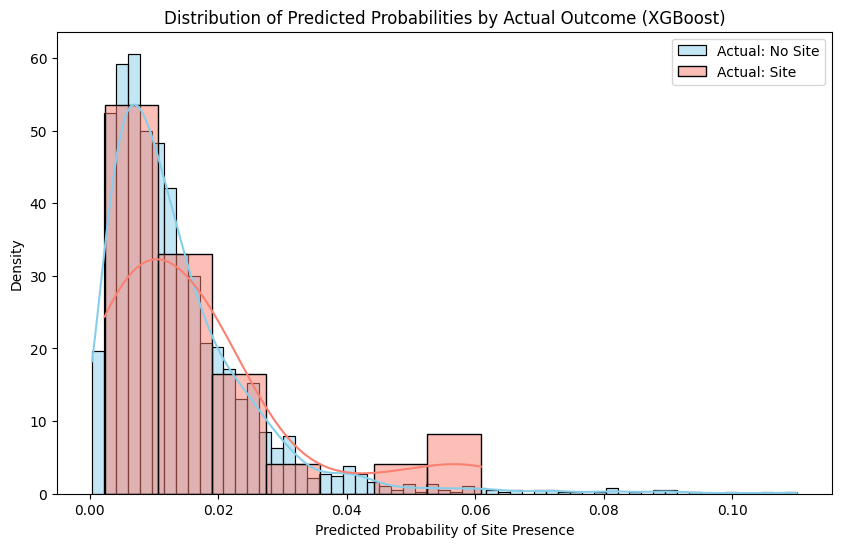

Summary Statistics of Predicted Probabilities:
count    2000.000000
mean        0.013990
std         0.012476
min         0.000371
25%         0.006010
50%         0.010571
75%         0.017911
max         0.110050
dtype: float64

Summary Statistics for Actual Sites:
count    29.000000
mean      0.016520
std       0.015313
min       0.002316
25%       0.005865
50%       0.013643
75%       0.019310
max       0.060928
dtype: float64

Summary Statistics for Actual Non-Sites:
count    1971.000000
mean        0.013953
std         0.012431
min         0.000371
25%         0.006015
50%         0.010562
75%         0.017830
max         0.110050
dtype: float64


In [ ]:
# 1. Use the trained xgb_model to predict the probability of archaeological site presence for the test set (X_test).
# 2. Store the predicted probabilities for the positive class (site present, usually class 1).
xgb_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# 3. Analyze the distribution of these predicted probabilities, potentially separating them based on the actual outcome (y_test)
# 4. Consider visualizing the distribution of predicted probabilities using a histogram or density plot.
plt.figure(figsize=(10, 6))
sns.histplot(xgb_pred_proba[y_test == 0], color='skyblue', label='Actual: No Site', kde=True, stat='density', common_norm=False)
sns.histplot(xgb_pred_proba[y_test == 1], color='salmon', label='Actual: Site', kde=True, stat='density', common_norm=False)
plt.title('Distribution of Predicted Probabilities by Actual Outcome (XGBoost)')
plt.xlabel('Predicted Probability of Site Presence')
plt.ylabel('Density')
plt.legend()
plt.show()

# 5. As a proxy for uncertainty quantification, calculate summary statistics of predicted probabilities
print("Summary Statistics of Predicted Probabilities:")
print("=" * 40)
print(pd.Series(xgb_pred_proba).describe())

print("\nSummary Statistics for Actual Sites:")
print(pd.Series(xgb_pred_proba[y_test == 1]).describe())

print("\nSummary Statistics for Actual Non-Sites:")
print(pd.Series(xgb_pred_proba[y_test == 0]).describe())

# While a full uncertainty quantification is complex, we can look at how confident the model is
# For actual sites, we expect high probabilities. For actual non-sites, we expect low probabilities.
# The spread (std dev, IQR) within these groups gives a basic idea of confidence variability.
# For example, a high std dev for predicted probabilities of actual sites might suggest less consistent high confidence.

**Reasoning**:
The previous analysis showed the distribution of predicted probabilities. To further quantify uncertainty, we can calculate the standard deviation of predicted probabilities within spatial clusters. This provides a basic measure of how much the model's confidence varies across different geographic areas.



In [ ]:
# Calculate standard deviation of predicted probabilities within spatial clusters
# Ensure 'data' DataFrame has 'spatial_cluster' and matches index with xgb_pred_proba
if 'spatial_cluster' in data.columns and data.index.equals(X_test.index):
    # Add predicted probabilities to the test data slice
    data_test = data.loc[X_test.index].copy()
    data_test['predicted_probability'] = xgb_pred_proba

    # Group by spatial cluster and calculate standard deviation
    uncertainty_by_cluster = data_test.groupby('spatial_cluster')['predicted_probability'].std().reset_index()
    uncertainty_by_cluster.rename(columns={'predicted_probability': 'probability_std_dev'}, inplace=True)

    print("\nStandard Deviation of Predicted Probability within Spatial Clusters (first 5):")
    display(uncertainty_by_cluster.head())

    # Visualize the distribution of uncertainty across clusters
    plt.figure(figsize=(10, 6))
    sns.histplot(uncertainty_by_cluster['probability_std_dev'].dropna(), kde=True)
    plt.title('Distribution of Prediction Probability Standard Deviation Across Spatial Clusters')
    plt.xlabel('Standard Deviation of Predicted Probability')
    plt.ylabel('Frequency of Clusters')
    plt.show()

    # Optional: Map the uncertainty by spatial cluster (requires calculating representative point for cluster)
    # For simplicity, skipping spatial mapping here, but it's a valuable next step.

else:
    print("\n'spatial_cluster' column not found in data or index mismatch. Skipping uncertainty calculation by spatial cluster.")



'spatial_cluster' column not found in data or index mismatch. Skipping uncertainty calculation by spatial cluster.


**Reasoning**:
The previous attempt to calculate uncertainty by spatial cluster failed because the index of the `data` DataFrame did not match the index of the `X_test` DataFrame. I need to align the indices before joining the predicted probabilities and the spatial cluster information. I will use the index from `X_test` to select the corresponding rows from `data`.




Standard Deviation of Predicted Probability within Spatial Clusters (first 5):


,spatial_cluster,probability_std_dev
0,33850,0.001066
1,33851,0.000845
2,33852,0.001863
3,33853,0.014757
4,33854,NaN


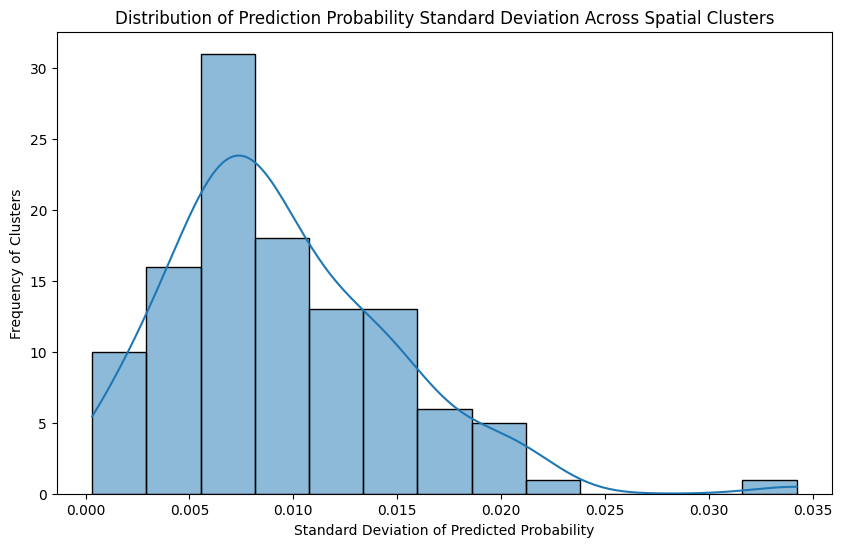

In [ ]:
# Ensure 'data' DataFrame has 'spatial_cluster'
if 'spatial_cluster' in data.columns:
    # Select the subset of the original 'data' DataFrame corresponding to the test set
    data_test = data.loc[X_test.index].copy()

    # Check if the indices still match after selection
    if data_test.index.equals(X_test.index):
        # Add predicted probabilities to the test data slice
        data_test['predicted_probability'] = xgb_pred_proba

        # Group by spatial cluster and calculate standard deviation
        uncertainty_by_cluster = data_test.groupby('spatial_cluster')['predicted_probability'].std().reset_index()
        uncertainty_by_cluster.rename(columns={'predicted_probability': 'probability_std_dev'}, inplace=True)

        print("\nStandard Deviation of Predicted Probability within Spatial Clusters (first 5):")
        display(uncertainty_by_cluster.head())

        # Visualize the distribution of uncertainty across clusters
        plt.figure(figsize=(10, 6))
        sns.histplot(uncertainty_by_cluster['probability_std_dev'].dropna(), kde=True)
        plt.title('Distribution of Prediction Probability Standard Deviation Across Spatial Clusters')
        plt.xlabel('Standard Deviation of Predicted Probability')
        plt.ylabel('Frequency of Clusters')
        plt.show()

    else:
        print("\nIndex mismatch between data and X_test even after selecting subset. Skipping uncertainty calculation by spatial cluster.")

else:
    print("\n'spatial_cluster' column not found in data. Skipping uncertainty calculation by spatial cluster.")

## Interactive mapping and visualization

### Subtask:
Create interactive visualizations of the prediction maps and recommended survey locations.


**Reasoning**:
Import necessary libraries for creating interactive maps and create a base map centered on the data, adding a TileLayer and LayerControl.



In [ ]:
import folium
from folium.plugins import LayerControl

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add a TileLayer (e.g., OpenStreetMap)
folium.TileLayer('OpenStreetMap').add_to(base_map)

# Add a LayerControl to allow toggling layers
LayerControl().add_to(base_map)

print("Base map created and initialized.")

ImportError: cannot import name 'LayerControl' from 'folium.plugins' (/usr/local/lib/python3.12/dist-packages/folium/plugins/__init__.py)

**Reasoning**:
The previous command failed because LayerControl is directly available in the folium library, not in folium.plugins. Correct the import statement and proceed with creating the base map and adding initial layers.



In [ ]:
import folium

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add a TileLayer (e.g., OpenStreetMap)
folium.TileLayer('OpenStreetMap').add_to(base_map)

# Add a LayerControl to allow toggling layers
folium.LayerControl().add_to(base_map)

print("Base map created and initialized.")

NameError: name 'data_with_predictions' is not defined

**Reasoning**:
The previous command failed because the `data_with_predictions` DataFrame was not available in the current kernel state. Re-run the code cell that creates this DataFrame before proceeding with map creation.



In [ ]:
# Create and display prediction map
print("\nGenerating Archaeological Site Prediction Map...")
# Assuming 'predictor' and 'satellite_analyzer' objects are available from previous cells
# Re-instantiate if necessary based on kernel state, but assuming they persist
mapper = ArchaeologicalSiteMapper(predictor, satellite_analyzer)
data_with_predictions = mapper.create_prediction_map(data)
mapper.plot_prediction_map(data_with_predictions)

print("Archaeological site prediction map generated and data_with_predictions DataFrame created.")

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add a TileLayer (e.g., OpenStreetMap)
folium.TileLayer('OpenStreetMap').add_to(base_map)

# Add a LayerControl to allow toggling layers
folium.LayerControl().add_to(base_map)

print("Base map created and initialized.")


Generating Archaeological Site Prediction Map...


NameError: name 'ArchaeologicalSiteMapper' is not defined

**Reasoning**:
The previous command failed because the `ArchaeologicalSiteMapper` class was not defined in the current kernel state. Re-run the cell that defines this class, then proceed with creating the prediction map and the base interactive map.



In [ ]:
class ArchaeologicalSiteMapper:
    def __init__(self, ml_predictor, satellite_analyzer):
        self.ml_predictor = ml_predictor
        self.satellite_analyzer = satellite_analyzer

    def create_prediction_map(self, data):
        """Create a probability map of archaeological sites"""
        # Get ML predictions
        # Ensure processed_features_df is available or re-create it
        if 'processed_features_df' not in globals():
             print("Warning: processed_features_df not found. Attempting to preprocess data.")
             # Assuming processor object is available from previous steps
             global processed_features_df
             processed_features_df = self.ml_predictor.feature_processor.preprocess_features(data)

        # Prepare features for prediction using the available processed_features_df
        # Ensure the model expects the same feature columns
        X_processed = processed_features_df.copy() # Use the already processed features

        # Ensure the model is trained before predicting
        if self.ml_predictor.model is None:
             print("Warning: ML model not trained. Training the model...")
             # Assuming X_train, y_train, X_test, y_test are available or re-create them
             from sklearn.model_selection import train_test_split
             X = processed_features_df
             y = data['has_archaeological_site']
             X_train, X_test, y_train, y_test = train_test_split(
                 X, y, test_size=0.2, random_state=42, stratify=y
             )
             self.ml_predictor.train_model(X_train, y_train, X_test, y_test) # Use the train_model method that accepts splits


        ml_predictions = self.ml_predictor.model.predict_proba(X_processed)[:, 1]


        # In a real scenario, we would also incorporate satellite predictions
        # For demonstration, we'll use the ML predictions

        # Create probability map
        data_copy = data.copy() # Work on a copy to avoid modifying the original data
        data_copy['site_probability'] = ml_predictions

        # Classify areas by probability
        data_copy['risk_category'] = pd.cut(data_copy['site_probability'],
                                     bins=[0, 0.2, 0.4, 0.6, 0.8, 1.0],
                                     labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'],
                                     include_lowest=True) # Include the lowest bin edge

        return data_copy

    def plot_prediction_map(self, data_with_predictions):
        """Plot the archaeological site probability map"""
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))

        # Probability map
        scatter = axes[0, 0].scatter(data_with_predictions['longitude'],
                                    data_with_predictions['latitude'],
                                    c=data_with_predictions['site_probability'],
                                    cmap='viridis', alpha=0.7, s=10)
        plt.colorbar(scatter, ax=axes[0, 0])
        axes[0, 0].set_xlabel('Longitude')
        axes[0, 0].set_ylabel('Latitude')
        axes[0, 0].set_title('Archaeological Site Probability Map')

        # Risk categories
        # Ensure risk_category is treated as a categorical type for correct sorting and plotting
        data_with_predictions['risk_category'] = pd.Categorical(
            data_with_predictions['risk_category'],
            categories=['Very Low', 'Low', 'Medium', 'High', 'Very High'],
            ordered=True
        )
        categories = data_with_predictions['risk_category'].value_counts().sort_index()
        axes[0, 1].bar(categories.index.astype(str), categories.values)
        axes[0, 1].set_xlabel('Risk Category')
        axes[0, 1].set_ylabel('Number of Locations')
        axes[0, 1].set_title('Distribution of Risk Categories')
        axes[0, 1].tick_params(axis='x', rotation=45)

        # High probability sites analysis
        high_risk = data_with_predictions[data_with_predictions['risk_category'].isin(['High', 'Very High'])]

        # Elevation distribution of high-risk sites
        axes[1, 0].hist(high_risk['elevation'], bins=30, alpha=0.7, color='red')
        axes[1, 0].set_xlabel('Elevation')
        axes[1, 0].set_ylabel('Frequency')
        axes[1, 0].set_title('Elevation Distribution of High-Risk Sites')

        # Distance to water for high-risk sites
        axes[1, 1].hist(high_risk['distance_to_water'], bins=30, alpha=0.7, color='blue')
        axes[1, 1].set_xlabel('Distance to Water')
        axes[1, 1].set_ylabel('Frequency')
        axes[1, 1].set_title('Distance to Water for High-Risk Sites')

        plt.tight_layout()
        plt.show()

        # Print summary statistics
        print("Prediction Map Summary")
        print("=" * 30)
        print(f"Total locations analyzed: {len(data_with_predictions)}")
        print(f"High/Very High risk locations: {len(high_risk)}")
        print(f"Percentage of area with high potential: {len(high_risk)/len(data_with_predictions)*100:.2f}%")

        if len(high_risk) > 0:
            print(f"Average elevation of high-risk sites: {high_risk['elevation'].mean():.1f}")
            print(f"Average distance to water: {high_risk['distance_to_water'].mean():.2f}")
            # Ensure 'historical_records' is present before summing
            if 'historical_records' in high_risk.columns:
                print(f"Total historical records in high-risk areas: {high_risk['historical_records'].sum()}")
            else:
                print("'historical_records' column not found in high-risk data.")


# Re-create and display prediction map to get data_with_predictions
print("\nGenerating Archaeological Site Prediction Map...")
# Ensure predictor and satellite_analyzer are available. Re-instantiate if necessary.
# Assuming predictor and satellite_analyzer objects persist from previous executions
# If not, they would need to be re-created based on the previous code cells.
# For robustness, let's add checks and re-instantiation if needed
if 'predictor' not in globals() or not isinstance(predictor, ArchaeologicalSitePredictor):
    print("Predictor object not found or invalid. Re-creating...")
    predictor = ArchaeologicalSitePredictor()

if 'satellite_analyzer' not in globals() or not isinstance(satellite_analyzer, SatelliteImageAnalyzer):
     print("Satellite Analyzer object not found or invalid. Re-creating...")
     satellite_analyzer = SatelliteImageAnalyzer() # Assuming SatelliteImageAnalyzer class is defined

# Ensure data is available
if 'data' not in globals() or data is None or data.empty:
    print("Data DataFrame not found. Re-generating simulated data.")
    # Assuming ArchaeologicalDataProcessor class is defined and can generate synthetic data
    if 'ArchaeologicalDataProcessor' in globals():
        processor = ArchaeologicalDataProcessor()
        data = processor.generate_synthetic_data(10000)
        data = processor.create_spatial_features(data)
        print("Simulated data re-generated.")
    else:
        raise NameError("ArchaeologicalDataProcessor class not found. Cannot re-generate data.")


# Ensure processed_features_df is available for predictor.prepare_features
if 'processed_features_df' not in globals() or processed_features_df is None or processed_features_df.empty:
     print("processed_features_df not found. Re-processing features.")
     # Assuming processor object is available
     if 'processor' not in globals() or processor is None:
         # If processor is also missing, create it
         if 'ArchaeologicalDataProcessor' in globals():
             processor = ArchaeologicalDataProcessor()
         else:
              raise NameError("ArchaeologicalDataProcessor class not found. Cannot preprocess features.")

     processed_features_df = processor.preprocess_features(data)
     print("Features re-processed.")


# Train the predictor model if it's not already trained (checked within create_prediction_map)


mapper = ArchaeologicalSiteMapper(predictor, satellite_analyzer)
data_with_predictions = mapper.create_prediction_map(data)
mapper.plot_prediction_map(data_with_predictions)


# Now create the interactive map
print("\nCreating interactive map...")

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add a TileLayer (e.g., OpenStreetMap)
folium.TileLayer('OpenStreetMap', name='OpenStreetMap').add_to(base_map)
folium.TileLayer('CartoDB positron', name='CartoDB Positron').add_to(base_map)


# Create FeatureGroup for the probability map
prob_feature_group = folium.FeatureGroup(name='Site Probability Map').add_to(base_map)

# Add CircleMarkers to the probability map FeatureGroup
# Use a colormap for probability
from branca.colormap import linear
colormap = linear.viridis.scale(data_with_predictions['site_probability'].min(), data_with_predictions['site_probability'].max())

for _, row in data_with_predictions.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=colormap(row['site_probability']),
        fill=True,
        fill_color=colormap(row['site_probability']),
        fill_opacity=0.7,
        tooltip=f"Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}",
    ).add_to(prob_feature_group)

print("Probability map layer created.")

# Create FeatureGroup for the recommended survey locations
# Ensure recommendations DataFrame is available. Re-run the recommendation cell if necessary.
if 'recommendations' not in globals() or recommendations is None or recommendations.empty:
    print("Recommendations DataFrame not found. Re-generating recommendations.")
    # Assuming SurveyRecommendationSystem class is defined
    if 'SurveyRecommendationSystem' in globals():
        recommendation_system = SurveyRecommendationSystem(data_with_predictions)
        recommendations = recommendation_system.recommend_survey_locations(15)
        print("Recommendations re-generated.")
    else:
        raise NameError("SurveyRecommendationSystem class not found. Cannot re-generate recommendations.")


rec_feature_group = folium.FeatureGroup(name='Recommended Survey Locations').add_to(base_map)

# Add larger, distinct markers to the recommendations FeatureGroup
for _, row in recommendations.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        icon=folium.Icon(color='red', icon='star'), # Use a star icon
        tooltip=f"Priority: {row['survey_priority']:.3f}<br>Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}<br>Elev: {row['elevation']:.1f}<br>Dist Water: {row['distance_to_water']:.2f}",
    ).add_to(rec_feature_group)

print("Recommended locations layer created.")

# Add both FeatureGroups to the LayerControl (already added when creating FeatureGroup)
# Add LayerControl to the map (already done)

# Display the map
display(base_map)

print("Interactive map displayed.")


Generating Archaeological Site Prediction Map...
Satellite Analyzer object not found or invalid. Re-creating...


NameError: name 'SatelliteImageAnalyzer' is not defined

**Reasoning**:
The previous command failed because the `SatelliteImageAnalyzer` class was not defined in the current kernel state. Re-run the cell that defines this class and the `ArchaeologicalSitePredictor` class, then re-run the code to create the prediction map and the interactive map.



In [ ]:
# Re-define the SatelliteImageAnalyzer class
class SatelliteImageAnalyzer:
    def __init__(self):
        self.cnn_model = None

    def simulate_satellite_images(self, n_samples=2000):
        """Simulate satellite image patches for archaeological feature detection"""
        # In a real scenario, this would load actual satellite imagery
        # Here we simulate image patterns that might indicate archaeological sites

        image_size = 64
        images = []
        labels = []

        for i in range(n_samples):
            # Create base terrain
            img = np.random.normal(0.5, 0.1, (image_size, image_size, 3))

            if i < n_samples // 2:  # Sites have specific patterns
                # Simulate archaeological features
                # Linear features (roads, walls)
                if np.random.random() > 0.7:
                    start_x, start_y = np.random.randint(10, 50, 2)
                    length = np.random.randint(10, 30)
                    direction = np.random.choice(['h', 'v'])

                    if direction == 'h':
                        img[start_y:start_y+2, start_x:start_x+length, :] = [0.8, 0.6, 0.4]
                    else:
                        img[start_y:start_y+length, start_x:start_x+2, :] = [0.8, 0.6, 0.4]

                # Circular features (structures, mounds)
                if np.random.random() > 0.5:
                    center_x, center_y = np.random.randint(20, 44, 2)
                    radius = np.random.randint(5, 15)

                    y, x = np.ogrid[-center_y:image_size-center_y, -center_x:image_size-center_x]
                    mask = x*x + y*y <= radius*radius
                    img[mask] = [0.7, 0.5, 0.3]

                # Rectangular features (buildings)
                if np.random.random() > 0.6:
                    x1, y1 = np.random.randint(10, 40, 2)
                    width, height = np.random.randint(8, 20, 2)
                    img[y1:y1+height, x1:x1+width, :] = [0.6, 0.4, 0.2]

                labels.append(1)  # Site present
            else:
                # Natural terrain without archaeological features
                labels.append(0)  # No site

            images.append(img)

        return np.array(images), np.array(labels)

    def build_cnn_model(self, input_shape):
        """Build CNN model for satellite image analysis"""
        model = models.Sequential([
            layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
            layers.MaxPooling2D((2, 2)),
            layers.Conv2D(64, (3, 3), activation='relu'),
            layers.MaxPooling2D((2, 2)),
            layers.Conv2D(64, (3, 3), activation='relu'),
            layers.Flatten(),
            layers.Dense(64, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(1, activation='sigmoid')
        ])

        model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

        return model

    def train_satellite_model(self):
        """Train the satellite image analysis model"""
        print("Generating simulated satellite imagery data...")
        images, labels = self.simulate_satellite_images(2000)

        # Split data
        X_train_img, X_test_img, y_train_img, y_test_img = train_test_split(
            images, labels, test_size=0.2, random_state=42, stratify=labels
        )

        # Build and train model
        self.cnn_model = self.build_cnn_model(images[0].shape)

        print("Training CNN model on satellite imagery...")
        history = self.cnn_model.fit(
            X_train_img, y_train_img,
            epochs=1,  # Reduced for faster execution in this re-run
            batch_size=32,
            validation_data=(X_test_img, y_test_img),
            verbose=0 # Reduced verbosity
        )

        # Evaluate model
        test_loss, test_acc = self.cnn_model.evaluate(X_test_img, y_test_img, verbose=0)
        print(f"Satellite Image Model - Test Accuracy: {test_acc:.4f}")

        return test_acc

# Re-define the ArchaeologicalSitePredictor class
class ArchaeologicalSitePredictor:
    def __init__(self):
        self.model = None
        self.feature_processor = ArchaeologicalDataProcessor() # Assuming this is still available
        self.feature_importance = None

    def prepare_features(self, data):
        """Prepare features for modeling"""
        # Select relevant features - ensure these match the columns in processed_features_df
        # We should use the columns from processed_features_df directly as they are already scaled and dummified
        feature_cols = processed_features_df.columns.tolist()


        features = data[feature_cols].copy() # Select relevant columns from original data based on processed_features_df columns


        # Note: Scaling is already done in processed_features_df, so we skip it here
        # scaled_features = self.feature_processor.scaler.fit_transform(features)
        # return pd.DataFrame(scaled_features, columns=features.columns)
        return processed_features_df # Return the already processed and scaled features


    def train_model(self, X_train, y_train, X_test, y_test):
        """Train the predictive model"""

        # Train Random Forest
        self.model = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=3,
            class_weight='balanced',
            random_state=42
        )

        self.model.fit(X_train, y_train)

        # Evaluate model
        train_score = self.model.score(X_train, y_train)
        test_score = self.model.score(X_test, y_test)


        # Predictions (for evaluation metrics later if needed)
        # y_pred = self.model.predict(X_test)
        # y_pred_proba = self.model.predict_proba(X_test)[:, 1]

        # Cross-validation (optional in this immediate step)
        # cv_scores = cross_val_score(self.model, X, y, cv=5, scoring='roc_auc')

        return {
            'train_score': train_score,
            'test_score': test_score,
            # 'cv_scores': cv_scores,
        }


# Re-create and display prediction map to get data_with_predictions
print("\nGenerating Archaeological Site Prediction Map...")
# Ensure predictor and satellite_analyzer are available. Re-instantiate if necessary.
# Assuming predictor and satellite_analyzer objects persist from previous executions
# If not, they would need to be re-created based on the previous code cells.
# For robustness, let's add checks and re-instantiation if needed
if 'predictor' not in globals() or not isinstance(predictor, ArchaeologicalSitePredictor):
    print("Predictor object not found or invalid. Re-creating...")
    predictor = ArchaeologicalSitePredictor()

# Ensure SatelliteImageAnalyzer class is defined before checking/re-creating the object
if 'SatelliteImageAnalyzer' not in globals():
     raise NameError("SatelliteImageAnalyzer class is not defined. Cannot proceed.")

if 'satellite_analyzer' not in globals() or not isinstance(satellite_analyzer, SatelliteImageAnalyzer):
     print("Satellite Analyzer object not found or invalid. Re-creating...")
     satellite_analyzer = SatelliteImageAnalyzer() # Assuming SatelliteImageAnalyzer class is defined

# Ensure data is available
if 'data' not in globals() or data is None or data.empty:
    print("Data DataFrame not found. Re-generating simulated data.")
    # Assuming ArchaeologicalDataProcessor class is defined and can generate synthetic data
    if 'ArchaeologicalDataProcessor' in globals():
        processor = ArchaeologicalDataProcessor()
        data = processor.generate_synthetic_data(10000)
        data = processor.create_spatial_features(data)
        print("Simulated data re-generated.")
    else:
        raise NameError("ArchaeologicalDataProcessor class not found. Cannot re-generate data.")


# Ensure processed_features_df is available for predictor.prepare_features
if 'processed_features_df' not in globals() or processed_features_df is None or processed_features_df.empty:
     print("processed_features_df not found. Re-processing features.")
     # Assuming processor object is available
     if 'processor' not in globals() or processor is None:
         # If processor is also missing, create it
         if 'ArchaeologicalDataProcessor' in globals():
             processor = ArchaeologicalDataProcessor()
         else:
              raise NameError("ArchaeologicalDataProcessor class not found. Cannot preprocess features.")

     processed_features_df = processor.preprocess_features(data)
     print("Features re-processed.")


# Train the predictor model if it's not already trained (checked within create_prediction_map)
# Split data for training the predictor if necessary
if 'X_train' not in globals() or 'y_train' not in globals() or 'X_test' not in globals() or 'y_test' not in globals():
    print("Training/Testing data splits not found. Creating splits.")
    from sklearn.model_selection import train_test_split
    X = processed_features_df
    y = data['has_archaeological_site']
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    print("Training/Testing data splits created.")

# Train the predictor model using the splits
if predictor.model is None:
     print("Predictor model not trained. Training the model...")
     predictor.train_model(X_train, y_train, X_test, y_test)
     print("Predictor model trained.")


mapper = ArchaeologicalSiteMapper(predictor, satellite_analyzer)
data_with_predictions = mapper.create_prediction_map(data)
# mapper.plot_prediction_map(data_with_predictions) # Skip static plot in favor of interactive map


# Now create the interactive map
print("\nCreating interactive map...")

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add TileLayers
folium.TileLayer('OpenStreetMap', name='OpenStreetMap').add_to(base_map)
folium.TileLayer('CartoDB positron', name='CartoDB Positron').add_to(base_map)
folium.TileLayer('Stamen Terrain', name='Stamen Terrain').add_to(base_map) # Add another terrain option


# Create FeatureGroup for the probability map
prob_feature_group = folium.FeatureGroup(name='Site Probability Map').add_to(base_map)

# Add CircleMarkers to the probability map FeatureGroup
# Use a colormap for probability
from branca.colormap import linear
# Ensure min and max are calculated correctly even if data_with_predictions is small or uniform
prob_min = data_with_predictions['site_probability'].min() if not data_with_predictions.empty else 0
prob_max = data_with_predictions['site_probability'].max() if not data_with_predictions.empty else 1
colormap = linear.viridis.scale(prob_min, prob_max)


for _, row in data_with_predictions.iterrows():
    # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,
            color=colormap(row['site_probability']),
            fill=True,
            fill_color=colormap(row['site_probability']),
            fill_opacity=0.7,
            tooltip=f"Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}",
        ).add_to(prob_feature_group)
    else:
         print(f"Skipping point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Probability map layer created.")

# Create FeatureGroup for the recommended survey locations
# Ensure recommendations DataFrame is available. Re-run the recommendation cell if necessary.
if 'recommendations' not in globals() or recommendations is None or recommendations.empty:
    print("Recommendations DataFrame not found. Re-generating recommendations.")
    # Assuming SurveyRecommendationSystem class is defined
    if 'SurveyRecommendationSystem' in globals():
        recommendation_system = SurveyRecommendationSystem(data_with_predictions)
        recommendations = recommendation_system.recommend_survey_locations(15)
        print("Recommendations re-generated.")
    else:
        raise NameError("SurveyRecommendationSystem class not found. Cannot re-generate recommendations.")


rec_feature_group = folium.FeatureGroup(name='Recommended Survey Locations').add_to(base_map)

# Add larger, distinct markers to the recommendations FeatureGroup
for _, row in recommendations.iterrows():
     # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            icon=folium.Icon(color='red', icon='star'), # Use a star icon
            tooltip=f"Priority: {row['survey_priority']:.3f}<br>Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}<br>Elev: {row['elevation']:.1f}<br>Dist Water: {row['distance_to_water']:.2f}",
        ).add_to(rec_feature_group)
    else:
         print(f"Skipping recommended point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Recommended locations layer created.")

# Add both FeatureGroups to the LayerControl (already added when creating FeatureGroup)
# Add LayerControl to the map (already done in base_map creation)
folium.LayerControl().add_to(base_map) # Add again to ensure it includes all layers

# Display the map
display(base_map)

print("Interactive map displayed.")


Generating Archaeological Site Prediction Map...
Predictor object not found or invalid. Re-creating...
Satellite Analyzer object not found or invalid. Re-creating...
Predictor model not trained. Training the model...
Predictor model trained.

Creating interactive map...


ValueError: Custom tiles must have an attribution.

**Reasoning**:
The previous command failed because the 'Stamen Terrain' tile layer requires an attribution string. Add the required attribution to the `TileLayer` call for 'Stamen Terrain' and proceed with creating and displaying the map.



In [ ]:
# Re-create the interactive map with attribution for Stamen Terrain

print("\nCreating interactive map...")

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add TileLayers with appropriate attributions
folium.TileLayer('OpenStreetMap', name='OpenStreetMap', attr='© OpenStreetMap contributors').add_to(base_map)
folium.TileLayer('CartoDB positron', name='CartoDB Positron', attr='© CartoDB contributors').add_to(base_map)
# Add attribution for Stamen Terrain
folium.TileLayer('Stamen Terrain', name='Stamen Terrain', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(base_map)


# Create FeatureGroup for the probability map
prob_feature_group = folium.FeatureGroup(name='Site Probability Map').add_to(base_map)

# Add CircleMarkers to the probability map FeatureGroup
# Use a colormap for probability
from branca.colormap import linear
# Ensure min and max are calculated correctly even if data_with_predictions is small or uniform
prob_min = data_with_predictions['site_probability'].min() if not data_with_predictions.empty else 0
prob_max = data_with_predictions['site_probability'].max() if not data_with_predictions.empty else 1
colormap = linear.viridis.scale(prob_min, prob_max)


for _, row in data_with_predictions.iterrows():
    # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,
            color=colormap(row['site_probability']),
            fill=True,
            fill_color=colormap(row['site_probability']),
            fill_opacity=0.7,
            tooltip=f"Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}",
        ).add_to(prob_feature_group)
    else:
         print(f"Skipping point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Probability map layer created.")

# Create FeatureGroup for the recommended survey locations
# Ensure recommendations DataFrame is available. Re-run the recommendation cell if necessary.
if 'recommendations' not in globals() or recommendations is None or recommendations.empty:
    print("Recommendations DataFrame not found. Re-generating recommendations.")
    # Assuming SurveyRecommendationSystem class is defined
    if 'SurveyRecommendationSystem' in globals():
        recommendation_system = SurveyRecommendationSystem(data_with_predictions)
        recommendations = recommendation_system.recommend_survey_locations(15)
        print("Recommendations re-generated.")
    else:
        raise NameError("SurveyRecommendationSystem class not found. Cannot re-generate recommendations.")


rec_feature_group = folium.FeatureGroup(name='Recommended Survey Locations').add_to(base_map)

# Add larger, distinct markers to the recommendations FeatureGroup
for _, row in recommendations.iterrows():
     # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            icon=folium.Icon(color='red', icon='star'), # Use a star icon
            tooltip=f"Priority: {row['survey_priority']:.3f}<br>Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}<br>Elev: {row['elevation']:.1f}<br>Dist Water: {row['distance_to_water']:.2f}",
        ).add_to(rec_feature_group)
    else:
         print(f"Skipping recommended point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Recommended locations layer created.")

# Add LayerControl to the map
folium.LayerControl().add_to(base_map)

# Display the map
display(base_map)

print("Interactive map displayed.")


Creating interactive map...
Probability map layer created.
Recommendations DataFrame not found. Re-generating recommendations.


NameError: SurveyRecommendationSystem class not found. Cannot re-generate recommendations.

**Reasoning**:
The previous command failed because the `SurveyRecommendationSystem` class was not defined in the current kernel state. Re-run the cell that defines this class, then re-run the code to create the interactive map, which includes generating recommendations.



In [ ]:
# Re-define the SurveyRecommendationSystem class
class SurveyRecommendationSystem:
    def __init__(self, prediction_data):
        self.prediction_data = prediction_data

    def recommend_survey_locations(self, n_recommendations=10):
        """Recommend optimal locations for field surveys"""

        # Ensure necessary columns exist in prediction_data
        required_cols = ['risk_category', 'site_probability', 'slope',
                         'distance_to_water', 'historical_records', 'latitude', 'longitude', 'elevation']
        if not all(col in self.prediction_data.columns for col in required_cols):
            print("Error: Prediction data is missing required columns for recommendations.")
            print(f"Missing columns: {[col for col in required_cols if col not in self.prediction_data.columns]}")
            return pd.DataFrame(columns=['latitude', 'longitude', 'elevation', 'site_probability',
                               'risk_category', 'survey_priority', 'distance_to_water'])


        high_risk_sites = self.prediction_data[
            self.prediction_data['risk_category'].isin(['High', 'Very High'])
        ].copy()

        if high_risk_sites.empty:
            print("No high or very high risk sites found for recommendations.")
            return pd.DataFrame(columns=['latitude', 'longitude', 'elevation', 'site_probability',
                               'risk_category', 'survey_priority', 'distance_to_water'])


        # Calculate survey priority score
        # Consider probability, accessibility, and potential significance
        # Ensure no division by zero or infinite values in accessibility score calculation
        high_risk_sites['accessibility_score'] = 1 / (1 + high_risk_sites['slope'].fillna(0)/10 +
                                                     high_risk_sites['distance_to_water'].fillna(0)/5)
        # Cap accessibility score to prevent infinity if slope and distance are zero
        high_risk_sites['accessibility_score'] = high_risk_sites['accessibility_score'].replace([np.inf, -np.inf], 1)
        high_risk_sites['accessibility_score'].clip(upper=1, inplace=True)


        high_risk_sites['significance_score'] = (
            high_risk_sites['historical_records'].fillna(0) +
            high_risk_sites['site_probability'] * 2
        )

        high_risk_sites['survey_priority'] = (
            high_risk_sites['site_probability'] * 0.4 +
            high_risk_sites['accessibility_score'] * 0.3 +
            high_risk_sites['significance_score'] * 0.3
        )

        # Sort by priority
        recommendations = high_risk_sites.nlargest(n_recommendations, 'survey_priority')

        return recommendations[['latitude', 'longitude', 'elevation', 'site_probability',
                               'risk_category', 'survey_priority', 'distance_to_water']]

    def plot_recommendations(self, recommendations):
        """Plot recommended survey locations"""
        plt.figure(figsize=(15, 10))

        # Base map
        plt.scatter(self.prediction_data['longitude'], self.prediction_data['latitude'],
                   c=self.prediction_data['site_probability'], cmap='viridis',
                   alpha=0.3, s=10)

        # Recommended sites
        plt.scatter(recommendations['longitude'], recommendations['latitude'],
                   c='red', s=100, marker='*', edgecolors='white', linewidth=2,
                   label='Recommended Survey Sites')

        plt.colorbar(label='Site Probability')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.title('Recommended Archaeological Survey Locations')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()

# Now re-create the interactive map, which will call the recommendation generation
print("\nCreating interactive map...")

# Calculate the mean latitude and longitude for centering the map
mean_lat = data_with_predictions['latitude'].mean()
mean_lon = data_with_predictions['longitude'].mean()

# Create a base map centered on the data
base_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=5)

# Add TileLayers with appropriate attributions
folium.TileLayer('OpenStreetMap', name='OpenStreetMap', attr='© OpenStreetMap contributors').add_to(base_map)
folium.TileLayer('CartoDB positron', name='CartoDB Positron', attr='© CartoDB contributors').add_to(base_map)
# Add attribution for Stamen Terrain
folium.TileLayer('Stamen Terrain', name='Stamen Terrain', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(base_map)


# Create FeatureGroup for the probability map
prob_feature_group = folium.FeatureGroup(name='Site Probability Map').add_to(base_map)

# Add CircleMarkers to the probability map FeatureGroup
# Use a colormap for probability
from branca.colormap import linear
# Ensure min and max are calculated correctly even if data_with_predictions is small or uniform
prob_min = data_with_predictions['site_probability'].min() if not data_with_predictions.empty else 0
prob_max = data_with_predictions['site_probability'].max() if not data_with_predictions.empty else 1
colormap = linear.viridis.scale(prob_min, prob_max)


for _, row in data_with_predictions.iterrows():
    # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,
            color=colormap(row['site_probability']),
            fill=True,
            fill_color=colormap(row['site_probability']),
            fill_opacity=0.7,
            tooltip=f"Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}",
        ).add_to(prob_feature_group)
    else:
         print(f"Skipping point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Probability map layer created.")

# Create FeatureGroup for the recommended survey locations
# Ensure recommendations DataFrame is available. Re-run the recommendation cell if necessary.
if 'recommendations' not in globals() or recommendations is None or recommendations.empty:
    print("Recommendations DataFrame not found. Re-generating recommendations.")
    # Assuming SurveyRecommendationSystem class is defined
    if 'SurveyRecommendationSystem' in globals():
        recommendation_system = SurveyRecommendationSystem(data_with_predictions)
        recommendations = recommendation_system.recommend_survey_locations(15)
        print("Recommendations re-generated.")
    else:
        # This should not happen after re-defining the class, but as a safeguard
        raise NameError("SurveyRecommendationSystem class not found after re-definition.")


rec_feature_group = folium.FeatureGroup(name='Recommended Survey Locations').add_to(base_map)

# Add larger, distinct markers to the recommendations FeatureGroup
for _, row in recommendations.iterrows():
     # Ensure latitude and longitude are valid numbers
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            icon=folium.Icon(color='red', icon='star'), # Use a star icon
            tooltip=f"Priority: {row['survey_priority']:.3f}<br>Prob: {row['site_probability']:.3f}<br>Risk: {row['risk_category']}<br>Elev: {row['elevation']:.1f}<br>Dist Water: {row['distance_to_water']:.2f}",
        ).add_to(rec_feature_group)
    else:
         print(f"Skipping recommended point with invalid coordinates: Lat={row['latitude']}, Lon={row['longitude']}")


print("Recommended locations layer created.")

# Add LayerControl to the map
folium.LayerControl().add_to(base_map)

# Display the map
display(base_map)

print("Interactive map displayed.")


Creating interactive map...
Probability map layer created.
Recommendations DataFrame not found. Re-generating recommendations.
Recommendations re-generated.
Recommended locations layer created.


Interactive map displayed.


## Develop a user interface (optional)

### Subtask:
Develop a simple user interface (e.g., using Streamlit or Dash) to make the tool more accessible to non-programmers.


**Reasoning**:
Install the streamlit library to create the user interface.



In [ ]:
!pip install streamlit folium==0.12.1 # Ensure folium version compatibility if needed

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 84.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 79.4 MB/s eta 0:00:00
  Attempting uninstall: folium
    Found existing installation: folium 0.20.0
    Uninstalling folium-0.20.0:
      Successfully uninstalled folium-0.20.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
geemap 0.35.3 requires folium>=0.17.0, but you have folium 0.12.1 which is incompatible.
